In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

/home/jovyan/my-conda-envs/mypython3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


In [2]:
# meta info
sInfo = pd.read_csv('../sampleInfo.txt', sep = '\t', index_col = 0)
sInfo

,sample,pool,barcode,patient,name,group,mri_grading,age,psa,highest_GLEASON_score
SLX-15732SIGAC4HTVNWBBXXs_6,SLX-15732SIGAC4HTVNWBBXXs_6,SLX-15732,SIGAC4,D6,D6_T,tumor,5,54,20.30,4+5
SLX-15732SIGAD4HTVNWBBXXs_6,SLX-15732SIGAD4HTVNWBBXXs_6,SLX-15732,SIGAD4,D6,D6_N,normal,0,54,20.30,BN+PIN
SLX-15736SIGAA9HTHM2BBXXs_4,SLX-15736SIGAA9HTHM2BBXXs_4,SLX-15736,SIGAA9,D4,D4_T_1,tumor,4,58,9.90,3+4
SLX-15736SIGAA9HTHM2BBXXs_5,SLX-15736SIGAA9HTHM2BBXXs_5,SLX-15736,SIGAA9,D4,D4_T_2,tumor,4,58,9.90,3+4
SLX-15736SIGAB9HTHM2BBXXs_4,SLX-15736SIGAB9HTHM2BBXXs_4,SLX-15736,SIGAB9,D4,D4_N_1,normal,0,58,9.90,0
SLX-15736SIGAB9HTHM2BBXXs_5,SLX-15736SIGAB9HTHM2BBXXs_5,SLX-15736,SIGAB9,D4,D4_N_2,normal,0,58,9.90,0
SLX-15736SIGAD8HTHM2BBXXs_4,SLX-15736SIGAD8HTHM2BBXXs_4,SLX-15736,SIGAD8,D5,D5_T_1,tumor,5,71,16.50,3+4
SLX-15736SIGAD8HTHM2BBXXs_5,SLX-15736SIGAD8HTHM2BBXXs_5,SLX-15736,SIGAD8,D5,D5_T_2,tumor,5,71,16.50,3+4
SLX-15736SIGAE8HTHM2BBXXs_4,SLX-15736SIGAE8HTHM2BBXXs_4,SLX-15736,SIGAE8,D5,D5_N_1,normal,0,71,16.50,0
SLX-15736SIGAE8HTHM2BBXXs_5,SLX-15736SIGAE8HTHM2BBXXs_5,SLX-15736,SIGAE8,D5,D5_N_2,normal,0,71,16.50,0


In [3]:
# some set up
adata_list = []
for i in range(0, len(sInfo['sample'])):
    inputfolder='../Prostate_raw/soupx/Sample_'+sInfo['sample'][i]+'/'
    # import data
    adata = sc.read_10x_mtx(inputfolder, cache = True)
    adata.obs['sample'] = sInfo['sample'][i]
    adata.obs['pool'] = sInfo['pool'][i]
    adata.obs['barcode'] = sInfo['barcode'][i]
    adata.obs['patient'] = sInfo['patient'][i]
    adata.obs['name'] = sInfo['name'][i]
    adata.obs['group'] = sInfo['group'][i]
    adata.obs['mri_grading'] = sInfo['mri_grading'][i]
    adata.obs['age'] = sInfo['age'][i]
    adata.obs['psa'] = sInfo['psa'][i]
    adata.obs['highest_GLEASON_score'] = sInfo['highest_GLEASON_score'][i]
    # rename cells to sample id + barcode, cleaving the trailing -1
    adata.obs_names = [str(sInfo['sample'][i])+'_'+str(j).split('-')[0] for j in adata.obs_names]
    adata_list.append(adata)
adata = adata_list[0].concatenate(adata_list[1:], index_unique=None)
# free up memory
del adata_list
adata

... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15732SIGAC4HTVNWBBXXs_6-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15732SIGAD4HTVNWBBXXs_6-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15736SIGAA9HTHM2BBXXs_4-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15736SIGAA9HTHM2BBXXs_5-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15736SIGAB9HTHM2BBXXs_4-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15736SIGAB9HTHM2BBXXs_5-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15736SIGAD8HTHM2BBXXs_4-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15736SIGAD8HTHM2BBXXs_5-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15736SIGAE8HTHM2BBXXs_4-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15736SIGAE8HTHM2BBXXs_5-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15929SIGAC4HVLYKBBXXs_8-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15929SIGAD4HVLYKBBXXs_8-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15929SIGAG11HVLYKBBXXs_8-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15929SIGAH11HVLYKBBXXs_8-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16140SIGAB1HVMFKBBXXs_3-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16140SIGAC1HVMFKBBXXs_3-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16142SIGAG6HVMFKBBXXs_4-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16142SIGAH6HVMFKBBXXs_4-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16147SIGAE7HVMFKBBXXs_7-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16147SIGAF7HVMFKBBXXs_7-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16148SIGAG7HVMFKBBXXs_8-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16148SIGAH7HVMFKBBXXs_8-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16362SIGAA3HWFTVBBXXs_4-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-16362SIGAB3HWFTVBBXXs_4-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


AnnData object with n_obs × n_vars = 25326 × 33538 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample'
    var: 'gene_ids', 'feature_types'

In [4]:
def bh(pvalues):
    '''
    Computes the Benjamini-Hochberg FDR correction.
    
    Input:
        * pvals - vector of p-values to correct
    '''
    n = int(pvalues.shape[0])
    new_pvalues = np.empty(n)
    values = [ (pvalue, i) for i, pvalue in enumerate(pvalues) ]
    values.sort()
    values.reverse()
    new_values = []
    for i, vals in enumerate(values):
        rank = n - i
        pvalue, index = vals
        new_values.append((n/rank) * pvalue)
    for i in range(0, int(n)-1):
        if new_values[i] < new_values[i+1]:
            new_values[i+1] = new_values[i]
    for i, vals in enumerate(values):
        pvalue, index = vals
        new_pvalues[index] = new_values[i]
    return new_pvalues

# run Krystoff's doublet caller
scorenames = ['scrublet_score','scrublet_cluster_score','bh_pval']

dir = 'scrublet-scores'
if not os.path.exists(dir):
    os.makedirs(dir)

In [5]:
# loop over the subfolders of the main folder
for i in range(0, len(sInfo['sample'])):
    inputfolder='../Prostate_raw/soupx/Sample_'+sInfo['sample'][i]+'/'
    # import data
    adata_sample = sc.read_10x_mtx(inputfolder, cache = True)
    # rename cells to sample id + barcode, cleaving the trailing -1
    adata_sample.obs_names = [str(sInfo['sample'][i])+'_'+str(j).split('-')[0] for j in adata_sample.obs_names]
    # run Scrublet
    scrub = scr.Scrublet(adata_sample.X)
    doublet_scores, predicted_doublets = scrub.scrub_doublets(verbose=False)
    adata_sample.obs['scrublet_score'] = doublet_scores
    # overcluster prep. run turbo basic scanpy pipeline
    sc.pp.filter_genes(adata_sample, min_cells=3)
    sc.pp.normalize_per_cell(adata_sample, counts_per_cell_after=1e4)
    sc.pp.log1p(adata_sample)
    sc.pp.highly_variable_genes(adata_sample, min_mean=0.0125, max_mean=3, min_disp=0.5)
    adata_sample = adata_sample[:, adata_sample.var['highly_variable']]
    sc.pp.scale(adata_sample, max_value=10)
    sc.tl.pca(adata_sample, svd_solver='arpack')
    sc.pp.neighbors(adata_sample)
    # overclustering proper - do basic clustering first, then cluster each cluster
    sc.tl.leiden(adata_sample)
    for clus in np.unique(adata_sample.obs['leiden']):
        sc.tl.leiden(adata_sample, restrict_to=('leiden',[clus]))
    # compute the cluster scores - the median of Scrublet scores per overclustered cluster
    for clus in np.unique(adata_sample.obs['leiden']):
        adata_sample.obs.loc[adata_sample.obs['leiden']==clus, 'scrublet_cluster_score'] = \
            np.median(adata_sample.obs.loc[adata_sample.obs['leiden']==clus, 'scrublet_score'])
    # now compute doublet p-values. figure out the median and mad (from above-median values) for the distribution
    med = np.median(adata_sample.obs['scrublet_cluster_score'])
    mask = adata_sample.obs['scrublet_cluster_score']>med
    mad = np.median(adata_sample.obs['scrublet_cluster_score'][mask]-med)
    # do a one-sided test with Krystoff's implementation
    pvals = 1-scipy.stats.norm.cdf(adata_sample.obs['scrublet_cluster_score'], loc=med, scale=1.4826*mad)
    adata_sample.obs['bh_pval'] = bh(pvals)
    # create results data frame for single sample and copy stuff over from the adata object
    scrublet_sample = pd.DataFrame(0, index=adata_sample.obs_names, columns=scorenames)
    for meta in scorenames:
        scrublet_sample[meta] = adata_sample.obs[meta]
    # write out complete sample scores
    scrublet_sample.to_csv('scrublet-scores/'+sInfo['sample'][i]+'.csv')

... reading from cache file cache/..-Prostate_raw-soupx-Sample_SLX-15732SIGAC4HTVNWBBXXs_6-matrix.h5ad


Trying to set attribute `.obs` of view, making a copy.


filtered out 16868 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 16247 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 17824 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 17812 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 19697 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.

Trying to set attribute `.obs` of view, making a copy.


filtered out 19733 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.

Trying to set attribute `.obs` of view, making a copy.


filtered out 20447 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 20448 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 23639 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.

Trying to set attribute `.obs` of view, making a copy.


filtered out 23596 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.

Trying to set attribute `.obs` of view, making a copy.


filtered out 18698 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 28286 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 28909 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.

Trying to set attribute `.obs` of view, making a copy.


filtered out 28468 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.

Trying to set attribute `.obs` of view, making a copy.


filtered out 21354 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.

Trying to set attribute `.obs` of view, making a copy.


filtered out 17716 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 16904 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 17278 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 20856 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.

Trying to set attribute `.obs` of view, making a copy.


filtered out 24876 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.

Trying to set attribute `.obs` of view, making a copy.


filtered out 25294 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 28229 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 18352 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata

Trying to set attribute `.obs` of view, making a copy.


filtered out 27158 genes that are detected in less than 3 cells
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata

In [6]:
scrdf = []
for i in range(0, len(sInfo['sample'])):
    scrdf.append(pd.read_csv('scrublet-scores/'+sInfo['sample'][i]+'.csv', header=0, index_col=0))
scrdf = pd.concat(scrdf)
for meta in scorenames:
    adata.obs[meta] = scrdf[meta]

In [7]:
# threshold the p-values to get doublet calls.
adata.obs['is_doublet'] = adata.obs['bh_pval'] < 0.05
adata.obs['is_doublet'] = adata.obs['is_doublet'].astype('category')

In [8]:
# check size of adata
adata

AnnData object with n_obs × n_vars = 25326 × 33538 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet'
    var: 'gene_ids', 'feature_types'

In [9]:
# continue with the standard analysis first to visualise what's the doublet calling rate
adata_raw = adata.copy()
# filter cells based on standard cut offs
sc.pp.filter_cells(adata_raw, min_genes = 200)
sc.pp.filter_genes(adata_raw, min_cells = 3)
# get mitochondria QC stats
mito_genes = adata_raw.var_names.str.startswith('mt-')
adata_raw.obs['percent_mito'] = np.sum(adata_raw[:, mito_genes].X, axis = 1) / np.sum(adata_raw.X, axis = 1)
adata_raw.obs['n_counts'] = adata_raw.X.sum(axis = 1)
# filtering
adata_raw = adata_raw[adata_raw.obs['n_genes'] < 2500, :]
adata_raw = adata_raw[adata_raw.obs['percent_mito'] < 0.3, :] # relatively high because of epithelial cells
# normalize matrix X to 10000 reads per cell
sc.pp.normalize_per_cell(adata_raw, counts_per_cell_after=1e4)
# Logarithmize the data
sc.pp.log1p(adata_raw)
# Identify highly-variable genes.
sc.pp.highly_variable_genes(adata_raw, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# Actually do the filtering.
adata_raw = adata_raw[:, adata_raw.var['highly_variable']]
import multiprocessing
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(adata_raw, ['n_counts', 'percent_mito'], n_jobs = multiprocessing.cpu_count()-1)
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(adata_raw, max_value = 10)
# Principal component analysis
sc.tl.pca(adata_raw, svd_solver = 'arpack')
# rerun umap and clusters
sc.pp.neighbors(adata_raw, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_raw, n_components = 2, min_dist = 0.3)
adata_raw

filtered out 5199 cells that have less than 200 genes expressed
filtered out 11511 genes that are detected in less than 3 cells
normalizing by total count per cell


Trying to set attribute `.obs` of view, making a copy.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


Trying to set attribute `.obs` of view, making a copy.
... storing 'barcode' as categorical
Trying to set attribute `.obs` of view, making a copy.
... storing 'group' as categorical
Trying to set attribute `.obs` of view, making a copy.
... storing 'highest_GLEASON_score' as categorical
Trying to set attribute `.obs` of view, making a copy.
... storing 'name' as categorical
Trying to set attribute `.obs` of view, making a copy.
... storing 'patient' as categorical
Trying to set attribute `.obs` of view, making a copy.
... storing 'pool' as categorical
Trying to set attribute `.obs` of view, making a copy.
... storing 'sample' as categorical
Trying to set attribute `.var` of view, making a copy.
... storing 'feature_types' as categorical


    finished (0:01:11)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


AnnData object with n_obs × n_vars = 18212 × 2549 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

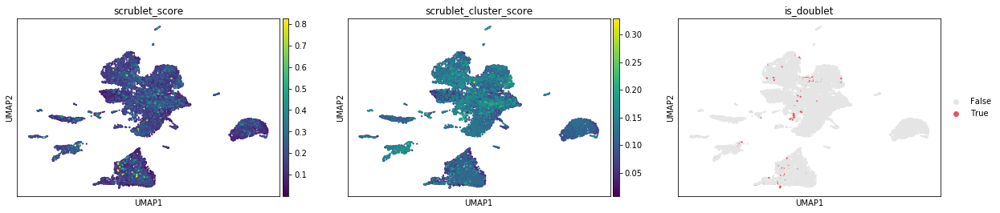

AnnData object with n_obs × n_vars = 18212 × 2549 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'is_doublet_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [10]:
# visualise the doublets
adata_raw.uns['is_doublet_colors'] = ['#e5e5e5', '#e15759']
sc.pl.umap(adata_raw, color = ['scrublet_score', 'scrublet_cluster_score', 'is_doublet'], size = 20)
adata_raw

In [11]:
# clear the unneeded objects
del adata_sample
del adata_raw

In [12]:
# now, actually remove doublets and rerun everything
adata = adata[adata.obs['is_doublet'] != True]
adata

View of AnnData object with n_obs × n_vars = 24979 × 33538 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet'
    var: 'gene_ids', 'feature_types'

normalizing counts per cell
    finished (0:00:00)


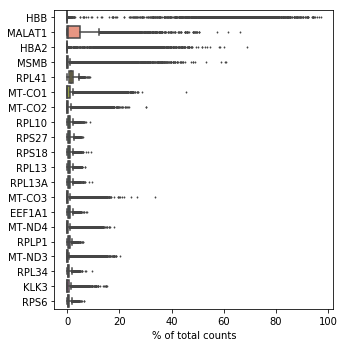

In [13]:
# continue with the standard analysis first
sc.settings.verbosity = 3
# plot higest expr genes
sc.pl.highest_expr_genes(adata, n_top = 20)

In [14]:
# filter cells based on standard cut offs
sc.pp.filter_cells(adata, min_genes = 200)
sc.pp.filter_genes(adata, min_cells = 3)
adata

filtered out 5147 cells that have less than 200 genes expressed


Trying to set attribute `.obs` of view, making a copy.


filtered out 11583 genes that are detected in less than 3 cells


AnnData object with n_obs × n_vars = 19832 × 21955 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [15]:
# get mitochondria QC stats
mito_genes = adata.var_names.str.startswith('MT-')
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis = 1) / np.sum(adata.X, axis = 1)
adata.obs['n_counts'] = adata.X.sum(axis = 1)

... storing 'barcode' as categorical
... storing 'group' as categorical
... storing 'highest_GLEASON_score' as categorical
... storing 'name' as categorical
... storing 'patient' as categorical
... storing 'pool' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical


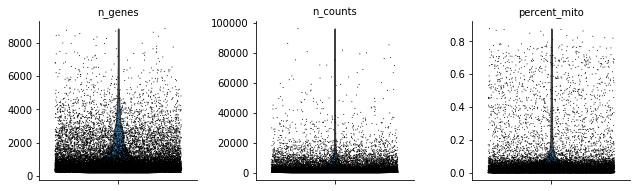

In [16]:
# violin plot of the computed quality measures.
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'], jitter = 0.4, multi_panel = True)

In [17]:
# final filtering
adata = adata[adata.obs['n_genes'] < 2500, :]
adata = adata[adata.obs['percent_mito'] < 0.3, :]
adata

View of AnnData object with n_obs × n_vars = 17108 × 21955 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [18]:
# median genes
adata.obs.n_genes.median()

602.5

In [19]:
# median nUMI
adata.obs.n_counts.median()

1192.3508

In [20]:
# set aside a copy as raw before continuing
adata_raw = adata.copy()
# normalize matrix X to 10000 reads per cell
sc.pp.normalize_total(adata)
# sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
# Logarithmize the data
sc.pp.log1p(adata)
# Set the .raw attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. 
adata.raw = adata

normalizing counts per cell


Trying to set attribute `.X` of view, making a copy.


    finished (0:00:38)


extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


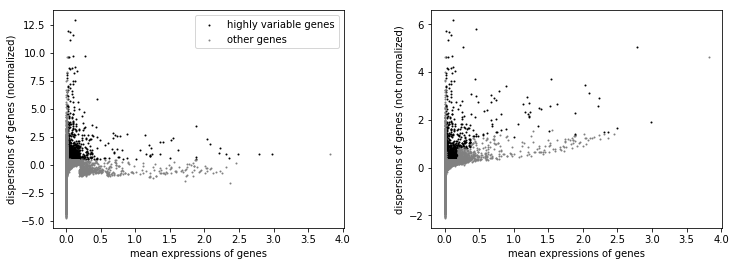

In [21]:
# Identify highly-variable genes.
sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# plot highly_variable_genes
sc.pl.highly_variable_genes(adata)

In [22]:
s_genes = ['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'NASP', 'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8']
g2m_genes = ['HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1', 'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA']
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs) (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs) (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


In [23]:
# Actually do the filtering.
adata = adata[:, adata.var['highly_variable']]

In [24]:
# regress and scale for PCA
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(adata, max_value = 10)
sc.tl.pca(adata, svd_solver = 'arpack')

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


Trying to set attribute `.obs` of view, making a copy.
... storing 'phase' as categorical


    finished (0:00:20)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:02)


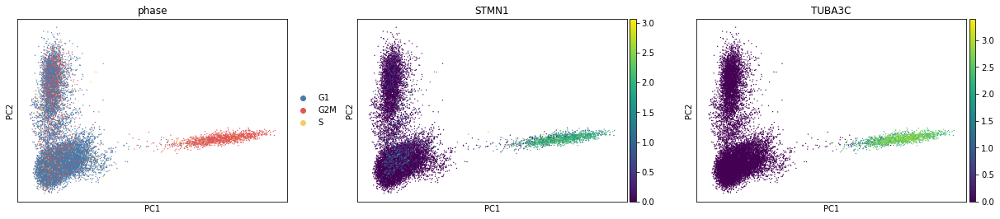

In [25]:
# visualise what the effect on the data cell cycle phase is doing
# just to check whether if it's just separating the sperm cells
sc.pl.pca_scatter(adata, color=['phase', 'STMN1', 'TUBA3C'], palette = ['#4e79a7', '#e15759', '#f1ce63'])
# yes it is. so just leave it

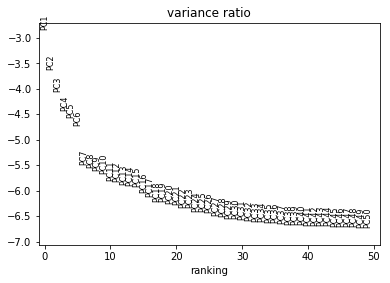

In [26]:
# Principal component analysis
sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)

In [27]:
# check object
adata

AnnData object with n_obs × n_vars = 17108 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'phase_colors'
    obsm: 'X_pca'
    varm: 'PCs'

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


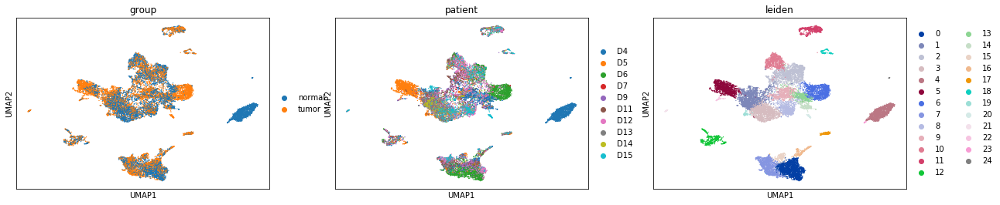

In [28]:
# Computing the neighborhood graph. Seurat uses k = 20 as default
sc.pp.neighbors(adata, n_neighbors = 10, n_pcs = 50)
# run UMAP
sc.tl.umap(adata, n_components = 2, min_dist = 0.3)
# find clusters
sc.tl.leiden(adata)
# plotting groups and clusters
sc.pl.umap(adata, color = ['group', 'patient', 'leiden'])

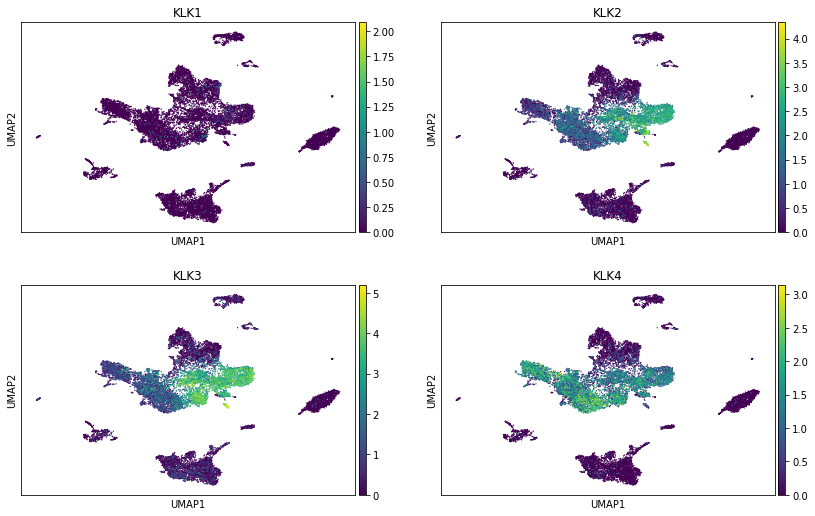

In [29]:
# check some expression
sc.pl.umap(adata, color = ['KLK1', 'KLK2', 'KLK3', 'KLK4'], ncols = 2)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:22)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:07)


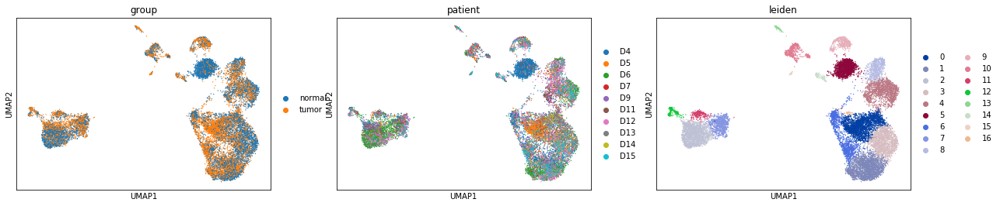

In [30]:
# batch correction using bbknn
sc.external.pp.bbknn(adata, batch_key = 'patient')
# rerun umap
sc.tl.umap(adata, n_components = 2, min_dist = 0.3)
# find clusters
sc.tl.leiden(adata)
sc.pl.umap(adata, color = ['group', 'patient', 'leiden'])

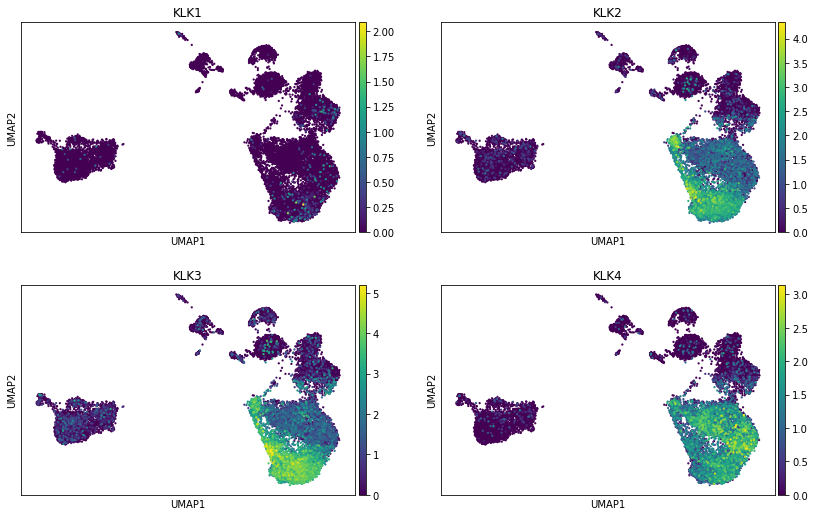

In [31]:
# check expression again
sc.pl.umap(adata, color = ['KLK1', 'KLK2', 'KLK3', 'KLK4'], ncols = 2, size = 20)

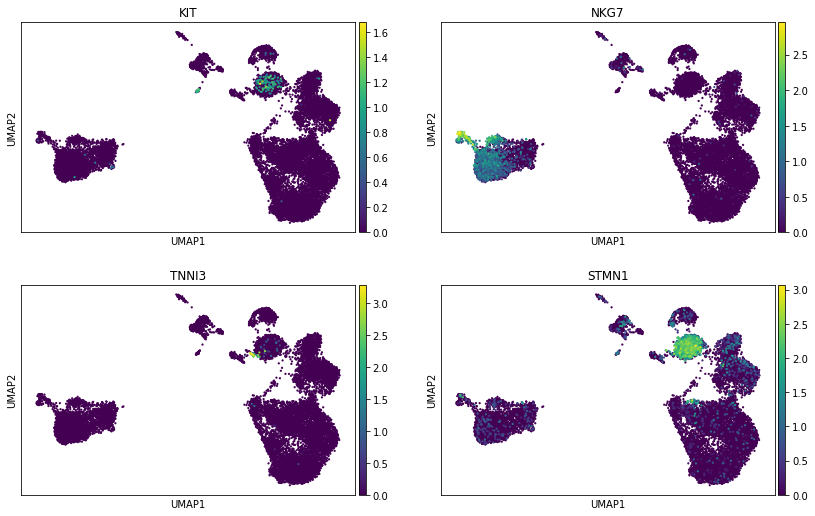

In [32]:
sc.pl.umap(adata, color = ['KIT', 'NKG7', 'TNNI3', 'STMN1'], ncols = 2, size = 20)

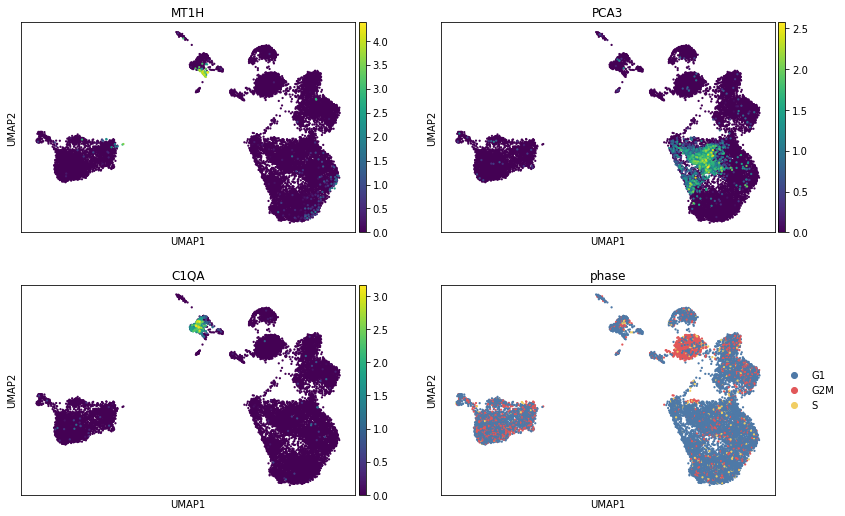

In [33]:
sc.pl.umap(adata, color = ['MT1H', 'PCA3', 'C1QA', 'phase'], ncols = 2, size = 20)

... storing 'orig_labels' as categorical


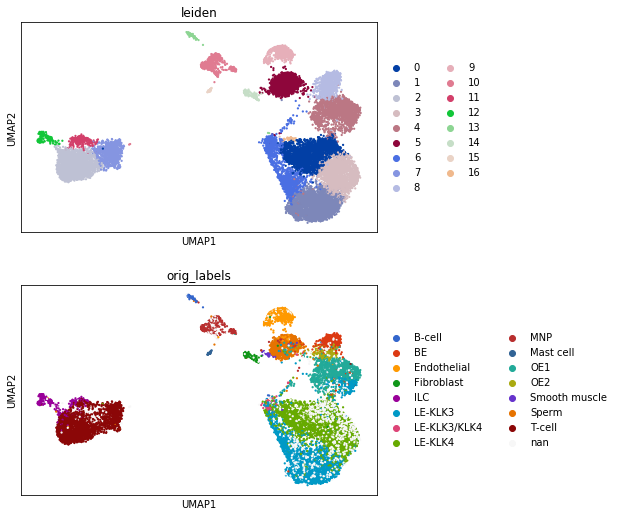

In [34]:
# hmm let's make a copy of the file and transfer the original labels
orig = pd.read_csv('../px.soupx.final_labels.csv', index_col = 0)
adatac = adata.copy()
adatac.obs = pd.merge(adatac.obs, orig, how = 'left', left_index=True, right_index=True)
adatac.uns['orig_labels_colors'] = ['#3366CC', '#DC3912', '#FF9900', '#109618', '#990099', '#0099C6', '#DD4477', '#66AA00', '#B82E2E', '#316395', '#22AA99', '#AAAA11', '#6633CC', '#E67300', '#8B0707', '#f7f7f7']
sc.pl.umap(adatac, color = ['leiden', 'orig_labels'], ncols = 1, size = 20)

In [35]:
# visualise the marker genes
marker_genes_dict = {'BE':['KRT17', 'KRT15', 'KRT19'],
    'LE':['MSMB', 'ACPP', 'KLK3', 'KLK4'],
    'CE':['RARRES1', 'KRT7', 'WFDC2'],
    'HE':['KRT13', 'IGFBP3', 'CSTB'],
    'SM':['TNNI3', 'SPARC', 'INHA'],
    'Fibro':['VIM', 'DCN', 'LUM'],
    'Endo':['IGFBP7', 'ACKR1', 'CLDN5'],
    'Sperm':['TUBA3C', 'STMN1', 'DAZL'],
    'MNP':['HLA-DQB1', 'HLA-DRB1', 'C1QA'],
    'Mast cell':['KIT', 'FCER1G', 'GATA2'],
    'NK':['NKG7', 'GZMB', 'KLRD1'],
    'T-cell':['TRAC', 'TRBC1', 'CD3E', 'CD8B'],
    'B-cell':['IGHM', 'MS4A1', 'CD79A']}

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: BE, LE, CE, etc.


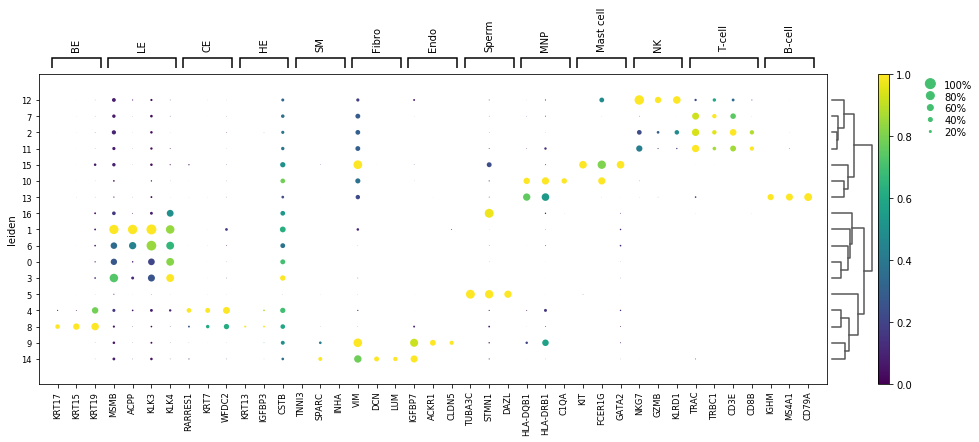

In [36]:
ax = sc.pl.dotplot(adata, marker_genes_dict, groupby='leiden', color_map = 'viridis', dendrogram=True, standard_scale='var')

categories: 0, 1, 2, etc.
var_group_labels: BE, LE, CE, etc.


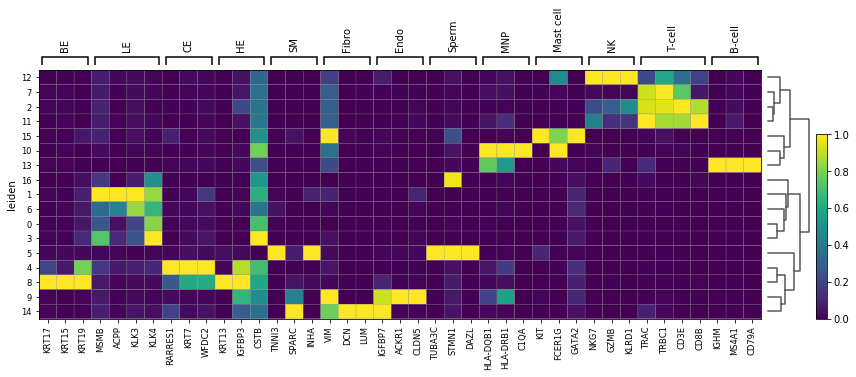

In [37]:
ax = sc.pl.matrixplot(adata, marker_genes_dict, groupby='leiden', dendrogram=True, standard_scale='var')

categories: 0, 1, 2, etc.
var_group_labels: BE, LE, CE, etc.


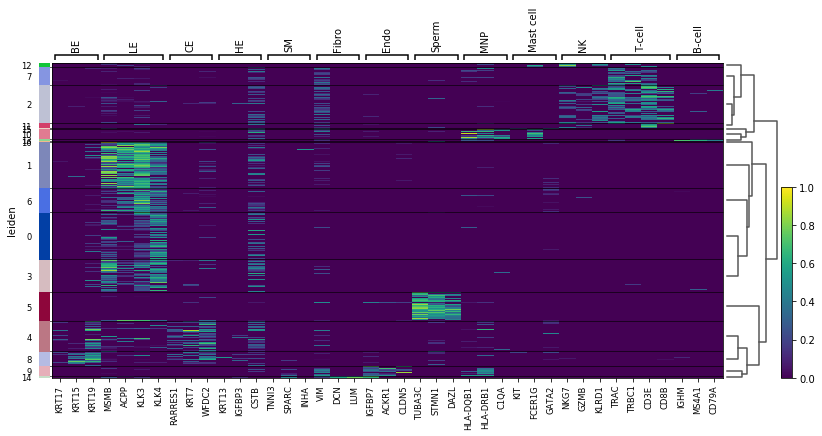

In [38]:
ax = sc.pl.heatmap(adata, marker_genes_dict, groupby='leiden', dendrogram=True, standard_scale='var')

categories: 0, 1, 2, etc.
var_group_labels: BE, LE, CE, etc.


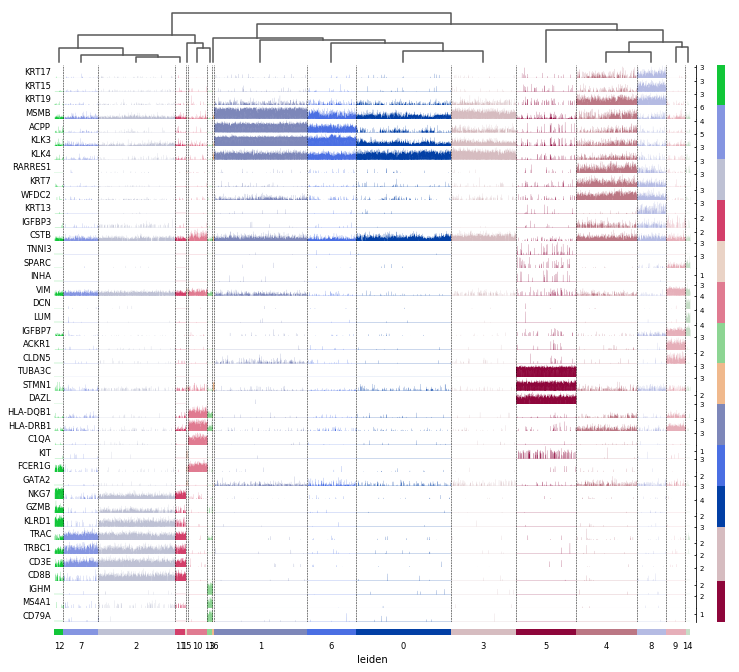

In [39]:
ax = sc.pl.tracksplot(adata,marker_genes_dict, groupby='leiden', dendrogram=True)

categories: 0, 1, 2, etc.
var_group_labels: BE, LE, CE, etc.


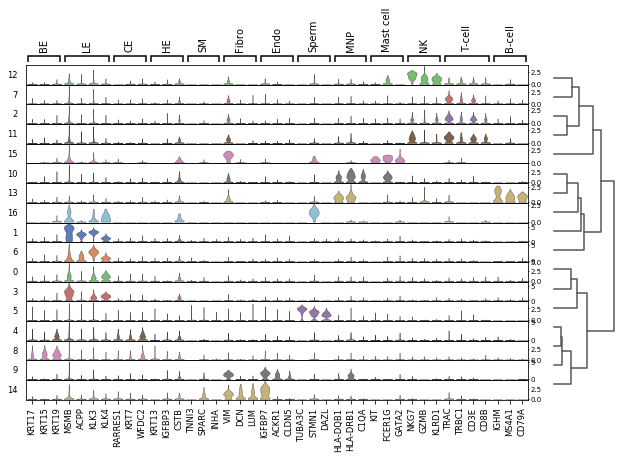

In [40]:
ax = sc.pl.stacked_violin(adata, marker_genes_dict, groupby='leiden', swap_axes=False, dendrogram=True)

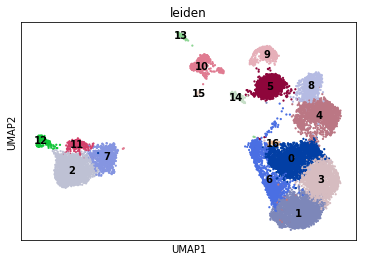

In [41]:
sc.pl.umap(adata, color = 'leiden', legend_loc = 'on data', size = 20)

In [42]:
# recluster 8
sc.tl.leiden(adata, resolution = 0.3, restrict_to = ['leiden', ['8']])

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


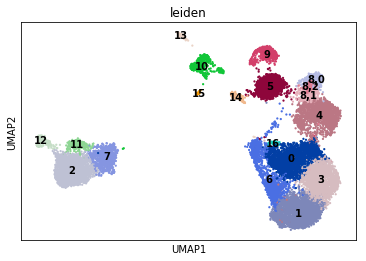

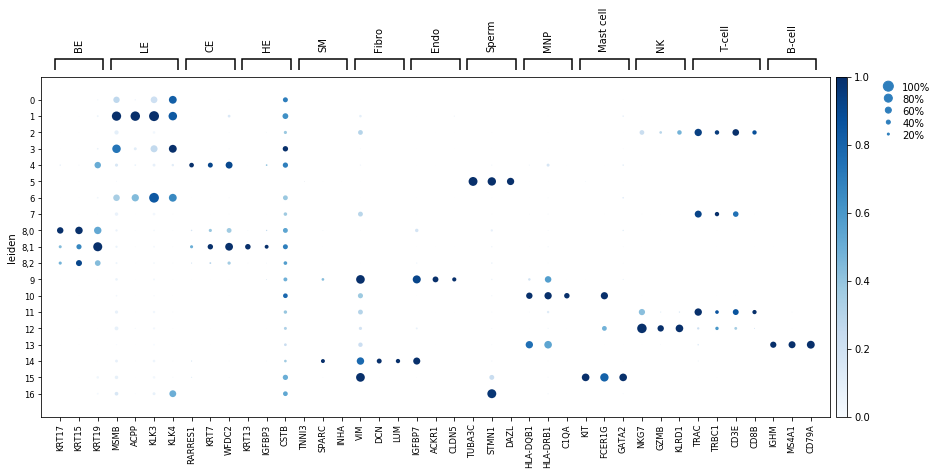

In [43]:
# visualise
sc.pl.umap(adata, color = ['leiden'], size = 20, legend_loc = 'on data')
ax = sc.pl.dotplot(adata, marker_genes_dict, groupby='leiden', color_map = 'Blues', standard_scale='var')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:27)


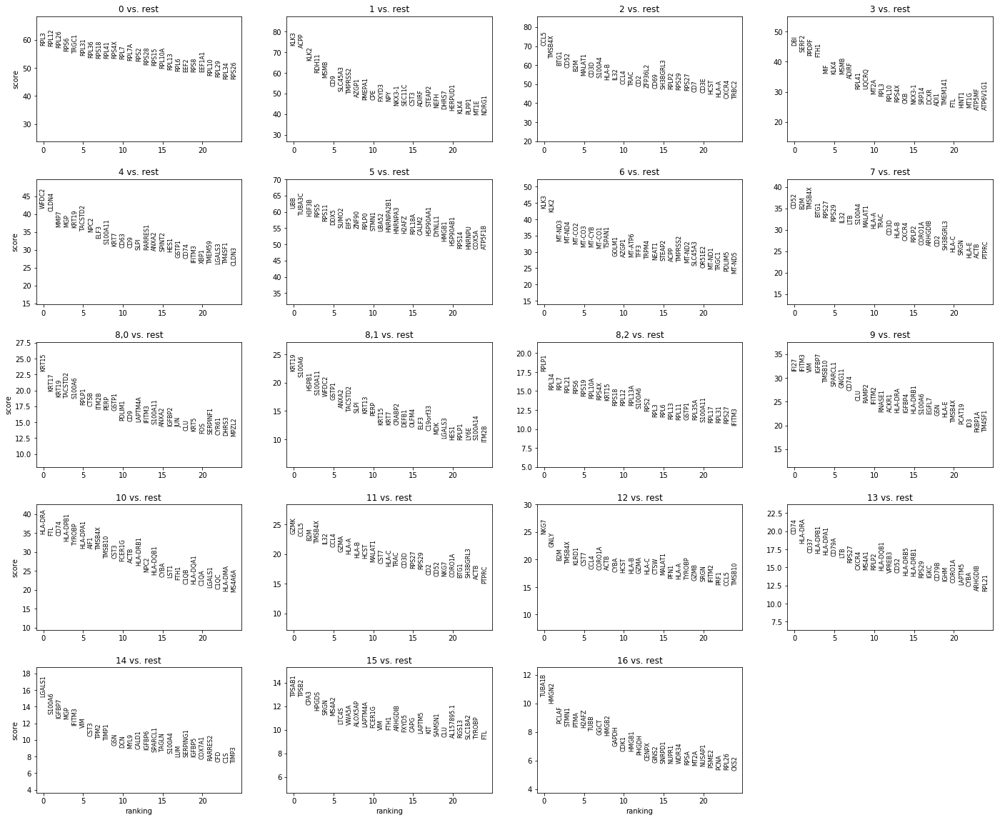

In [44]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

... storing 'celltype' as categorical


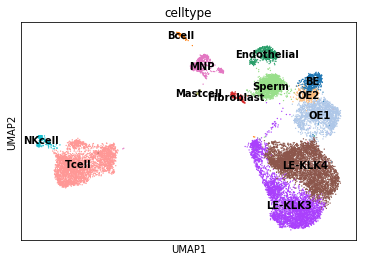

In [45]:
# create the new labels
label_dict =  {'0':'LE-KLK4', '1':'LE-KLK3', '2':'Tcell', '3':'LE-KLK4', '4':'OE1', '5':'Sperm', '6':'LE-KLK3', '7':'Tcell', '8,0':'BE', '8,1':'OE2', '8,2':'BE', '9':'Endothelial', '10':'MNP', '11':'Tcell', '12':'NKcell', '13':'Bcell', '14':'Fibroblast', '15':'Mastcell', '16':'LE-KLK4'}
adata.obs['celltype'] = [label_dict[x] for x in adata.obs['leiden']]
sc.pl.umap(adata, color = ['celltype'], legend_loc = 'on data')

In [46]:
# save this file
results_file = 'out/prostate.h5ad'
dir = 'out'
if not os.path.exists(dir):
    os.makedirs(dir)
adata.write(results_file, compression = 'gzip')

In [47]:
# also create a version to copy to seurat
results_file2 = 'out/prostate_raw.h5ad'
# Set the .raw attribute of AnnData object to the raw gene expression before normalizing
adata_raw.raw = adata_raw
# normalize matrix X to 10000 reads per cell
sc.pp.normalize_total(adata_raw)
# Logarithmize the data
sc.pp.log1p(adata_raw)
# transfer the adata meta info to adata_raw
adata_raw.obs = adata.obs
adata_raw.obsm = adata.obsm
adata_raw.uns = adata.uns
# save this new file
adata_raw.write(results_file2, compression='gzip')

normalizing counts per cell
    finished (0:00:00)


In [48]:
# check the objects
adata_raw

AnnData object with n_obs × n_vars = 17108 × 21955 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: 'log1p', 'pca', 'phase_colors', 'neighbors', 'umap', 'leiden', 'group_colors', 'patient_colors', 'leiden_colors', 'dendrogram_leiden', 'rank_genes_groups', 'celltype_colors'
    obsm: 'X_pca', 'X_umap'

In [49]:
adata

AnnData object with n_obs × n_vars = 17108 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'phase_colors', 'neighbors', 'umap', 'leiden', 'group_colors', 'patient_colors', 'leiden_colors', 'dendrogram_leiden', 'rank_genes_groups', 'celltype_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [61]:
adata.obs['celltype'].cat.categories

Index(['BE', 'Bcell', 'Endothelial', 'Fibroblast', 'LE-KLK3', 'LE-KLK4', 'MNP',
       'Mastcell', 'NKcell', 'OE1', 'OE2', 'Sperm', 'Tcell'],
      dtype='object')

In [29]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)
adata

scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


AnnData object with n_obs × n_vars = 17108 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype', 'Biopsy Location DETAIL', 'Biopsy Location BRIEF', 'Biopsy Location Co-ordinate', 'PMHx'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

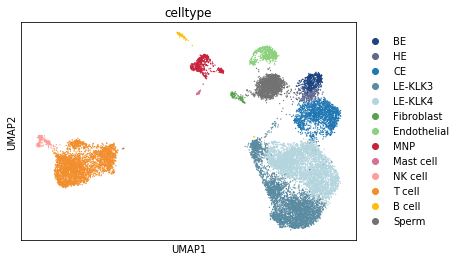

In [3]:
celltype_dict = {'BE':'BE', 'OE1':'CE', 'OE2':'HE', 'LE-KLK3':'LE-KLK3', 'LE-KLK4':'LE-KLK4', 'Endothelial':'Endothelial', 'Fibroblast':'Fibroblast', 'MNP':'MNP', 'Mastcell':'Mast cell', 'NKcell':'NK cell', 'Tcell':'T cell', 'Bcell':'B cell', 'Sperm':'Sperm'}
adata.obs['celltype'] = [celltype_dict[c] for c in adata.obs['celltype']]
sc.pl.umap(adata, color = 'celltype', palette = ['#1c4481', '#60688d', '#1f77b4', '#5b8ba1', '#b4d5de', '#59a14f', '#8cd17d', '#c7233b', '#d37295', '#ff9d9a', '#f28e2b', '#fcbf10', '#727272'])


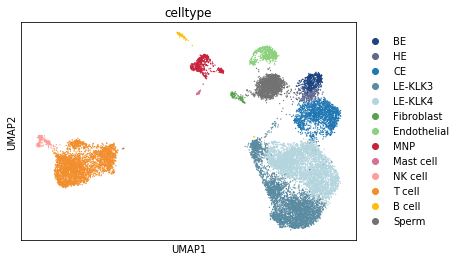

In [4]:
# reorder the categories
adata.obs['celltype'].cat.reorder_categories( ['BE', 'HE', 'CE', 'LE-KLK3', 'LE-KLK4', 'Fibroblast', 'Endothelial', 'MNP', 'Mast cell', 'NK cell', 'T cell', 'B cell', 'Sperm'], inplace=True)
sc.pl.umap(adata, color = 'celltype')

In [5]:
matplotlib.rcParams['figure.figsize'] 

[6.0, 4.0]

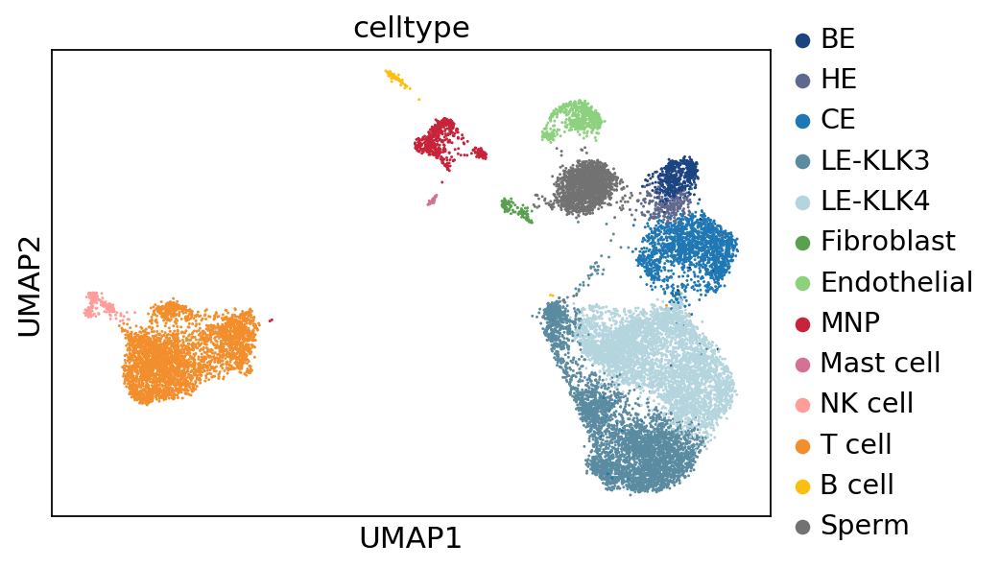

In [6]:
sc.set_figure_params(figsize = [6.0, 4.0], vector_friendly = True, dpi_save = 3200)
if not os.path.exists('figures/umap'):
    os.makedirs('figures/umap')
sc.pl.umap(adata, color = 'celltype', save = '/all cells.pdf')

In [7]:
# save the colours for now
adata.write(results_file, compression = 'gzip')

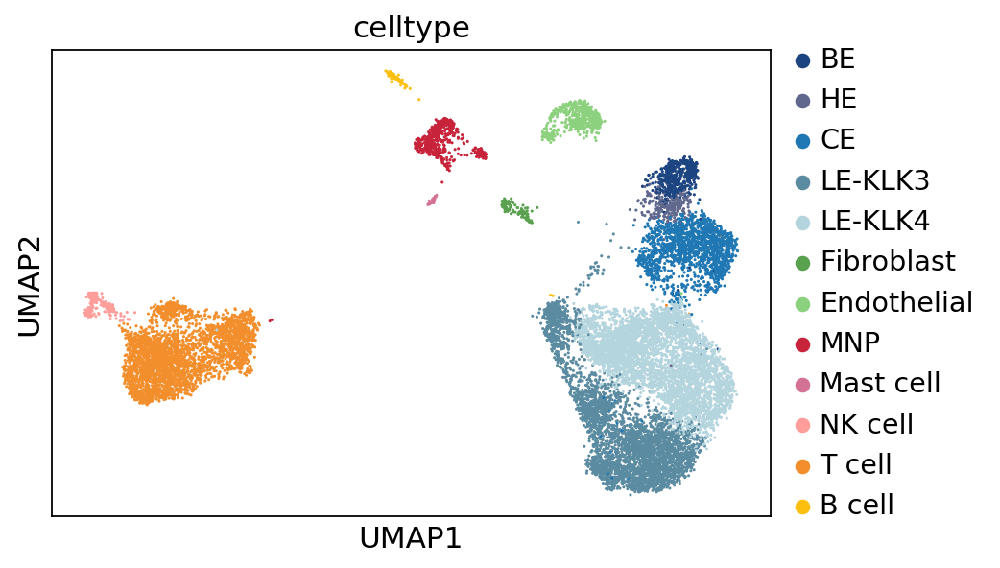

In [8]:
# remove sperm and call this adata2
adata2 = adata[~adata.obs['celltype'].isin(['Sperm'])]
sc.pl.umap(adata2, color = 'celltype', save = '/all cells2.pdf')

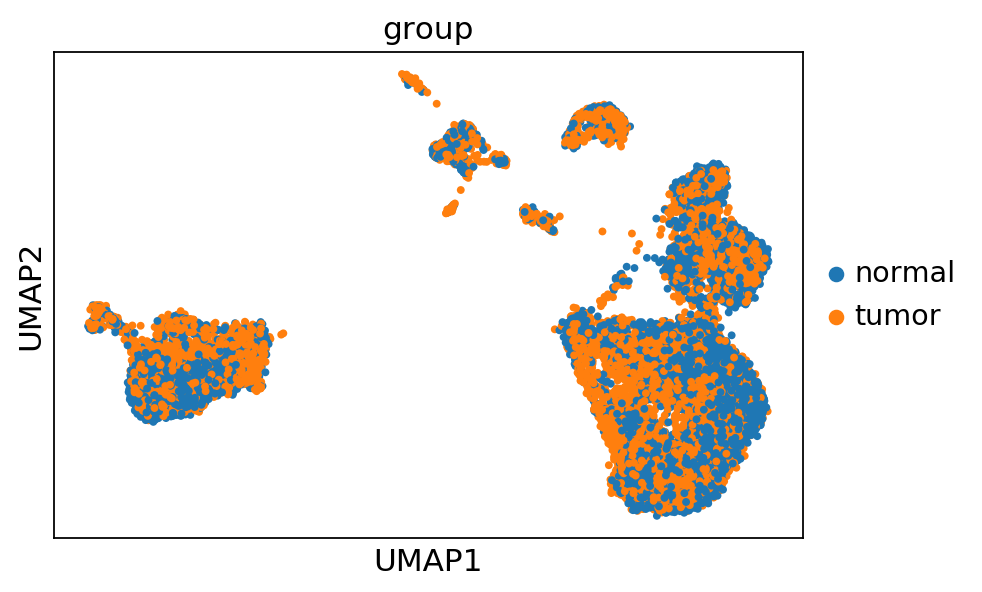

In [31]:
adata2 = adata[~adata.obs['celltype'].isin(['Sperm'])]
sc.set_figure_params(figsize = [6.0, 4.0], vector_friendly = True, dpi_save = 900)
sc.pl.umap(adata2, color = 'group', save = '/all cells2 group.pdf', size = 50)

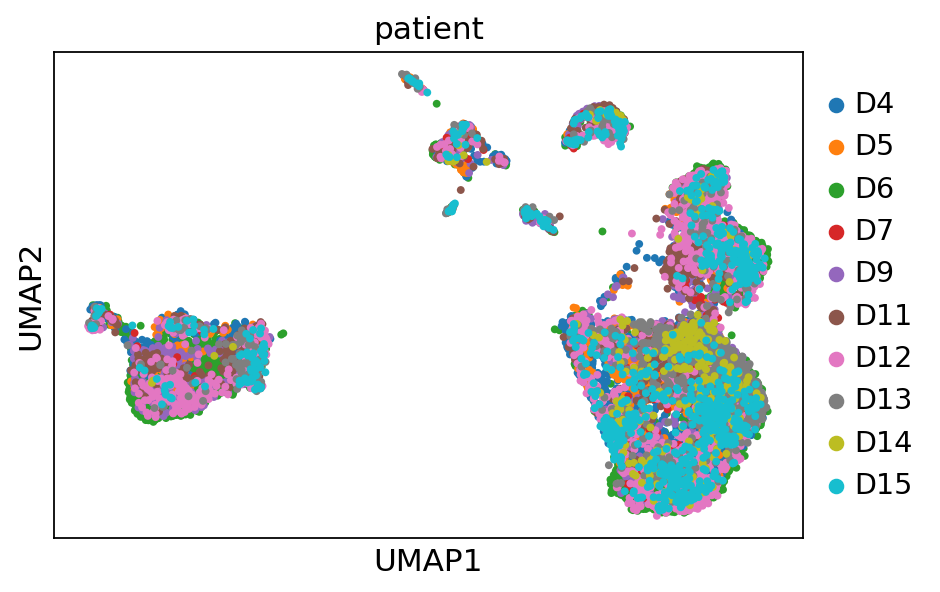

In [32]:
sc.pl.umap(adata2, color = 'patient', save = '/all cells2 patient.pdf', size = 50)

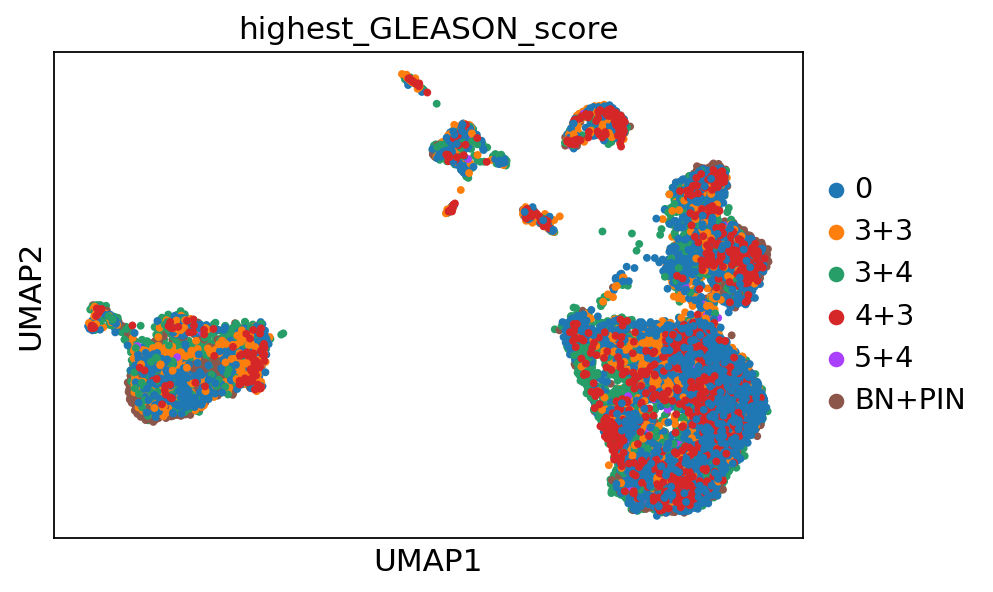

In [33]:
sc.pl.umap(adata2, color = 'highest_GLEASON_score', save = '/all cells2 gleason.pdf',size = 50)

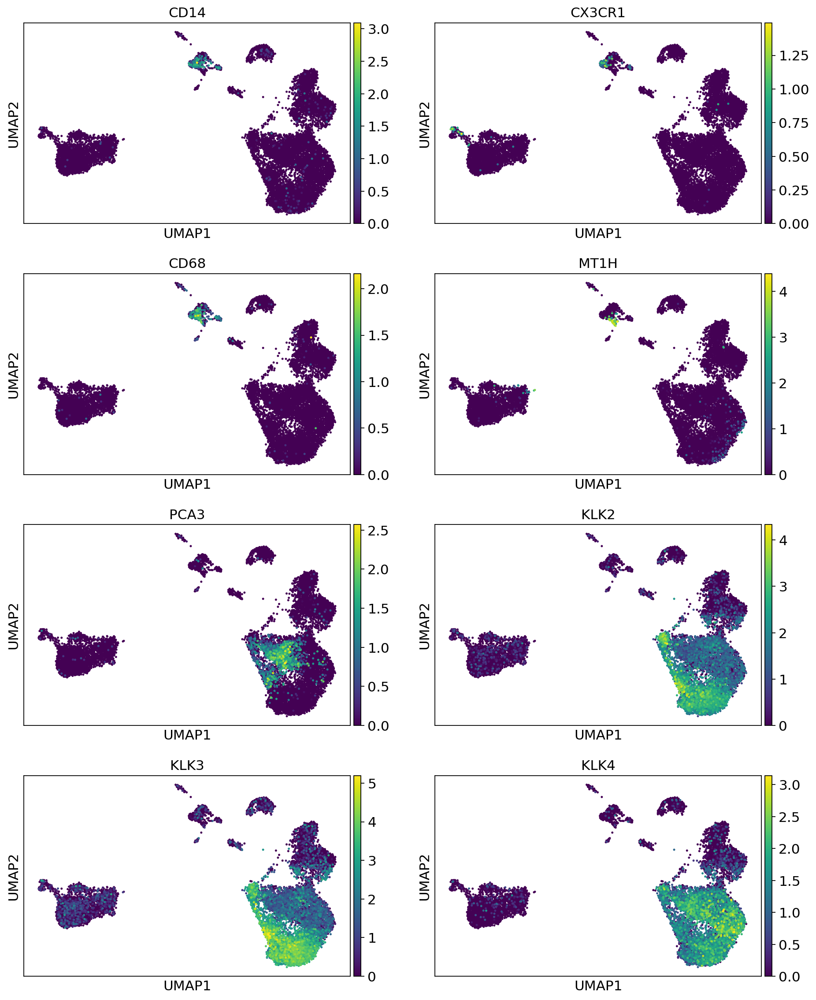

In [3]:
sc.set_figure_params(figsize = [6.0, 4.0], vector_friendly = True, dpi_save = 900)
sc.pl.umap(adata2, color = ['CD14', 'CX3CR1', 'CD68', 'MT1H', 'PCA3', 'KLK2', 'KLK3', 'KLK4'], ncols = 2, size = 20, color_map = 'viridis', save = '/useful markers.pdf')

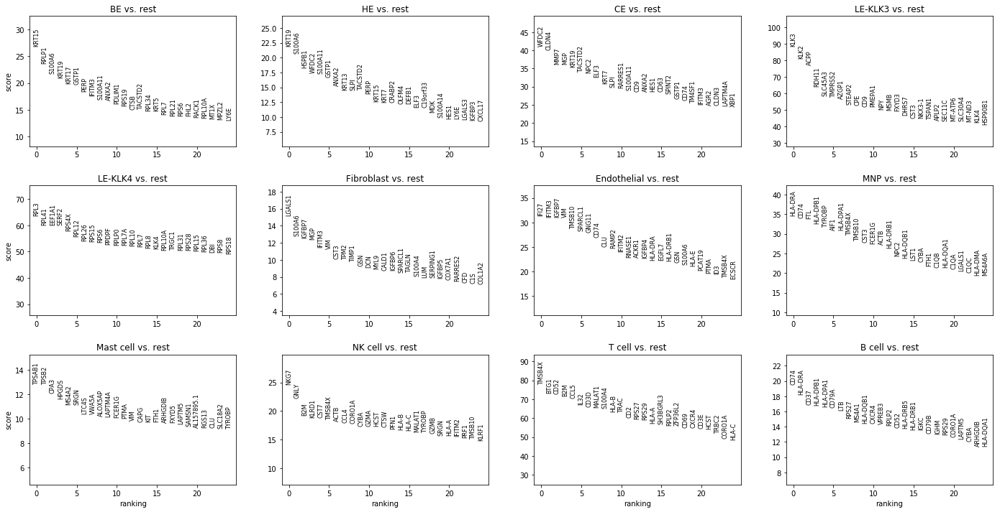

In [179]:
sc.tl.rank_genes_groups(adata2, groupby = 'celltype', method = 'wilcoxon')
sc.pl.rank_genes_groups(adata2, n_genes = 25, sharey = False)

scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


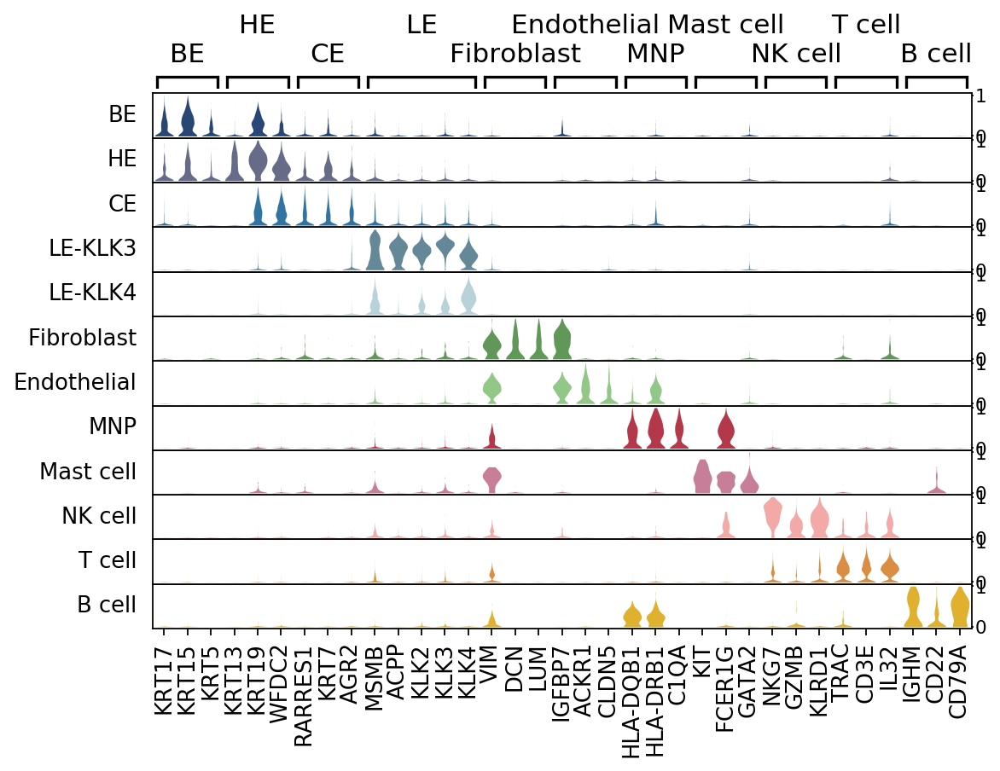

In [9]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)

adata2 = adata[~adata.obs['celltype'].isin(['Sperm'])]
marker_dict = {'BE':['KRT17', 'KRT15', 'KRT5'],
               'HE\n':['KRT13', 'KRT19', 'WFDC2'],
               'CE':['RARRES1', 'KRT7', 'AGR2'],
               'LE\n':['MSMB', 'ACPP', 'KLK2', 'KLK3', 'KLK4'],
               'Fibroblast':['VIM', 'DCN', 'LUM'],
               'Endothelial\n':['IGFBP7', 'ACKR1', 'CLDN5'],
               'MNP':['HLA-DQB1', 'HLA-DRB1', 'C1QA'],
               'Mast cell\n':['KIT', 'FCER1G', 'GATA2'],
               'NK cell':['NKG7', 'GZMB', 'KLRD1'],
               'T cell\n':['TRAC', 'CD3E', 'IL32'],
               'B cell':['IGHM', 'CD22', 'CD79A']}
if not os.path.exists('figures/stacked_violin'):
    os.makedirs('figures/stacked_violin')
sc.pl.stacked_violin(adata2, 
                     marker_dict, 
                     standard_scale = 'var', 
                     groupby = 'celltype', 
                     var_group_rotation = False, 
                     row_palette = ['#f28e2b', '#fcbf10', '#1c4481', '#60688d', '#1f77b4', '#5b8ba1', '#b4d5de', '#59a14f', '#8cd17d', '#c7233b', '#d37295', '#ff9d9a'],
                     linewidth = 0,
                     save = '/markers.pdf')

In [5]:
henryGeneSets = pd.read_csv('dataset/HenryGeneSets.txt', sep = '\t', keep_default_na=False)
for gs in list(henryGeneSets.columns):
    sc.tl.score_genes(adata2, [x for x in henryGeneSets[gs] if str(x) != ''], score_name = str(gs)+'_score', use_raw=True)

computing score 'Basal epithelia_score'
    finished: added
    'Basal epithelia_score', score of gene set (adata.obs) (0:00:00)
computing score 'Luminal epithelia_score'
    finished: added
    'Luminal epithelia_score', score of gene set (adata.obs) (0:00:00)
computing score 'Neuroendocrine epithelia_score'
    finished: added
    'Neuroendocrine epithelia_score', score of gene set (adata.obs) (0:00:00)
computing score 'Club epithelia_score'
    finished: added
    'Club epithelia_score', score of gene set (adata.obs) (0:00:00)
computing score 'Hillock epithelia_score'
    finished: added
    'Hillock epithelia_score', score of gene set (adata.obs) (0:00:00)
computing score 'Smooth muscle_score'
    finished: added
    'Smooth muscle_score', score of gene set (adata.obs) (0:00:00)
computing score 'Fibroblast_score'
    finished: added
    'Fibroblast_score', score of gene set (adata.obs) (0:00:00)
computing score 'Endothelia_score'
    finished: added
    'Endothelia_score', score of

In [10]:
# calculate average enrichment score
list1 = list(set(adata2.obs['celltype']))
subset = adata2.obs[['celltype'] + [str(gs)+'_score' for gs in henryGeneSets.columns]]
output = pd.DataFrame()
for x in list1:
    subsetX = subset[subset.celltype == x]
    outdict = {}
    for k in [str(gs)+'_score' for gs in henryGeneSets.columns]:
        out = {k:np.mean(subsetX[k])}
        outdict.update(out)
    output = output.append(outdict, ignore_index=True)
output.index = list1

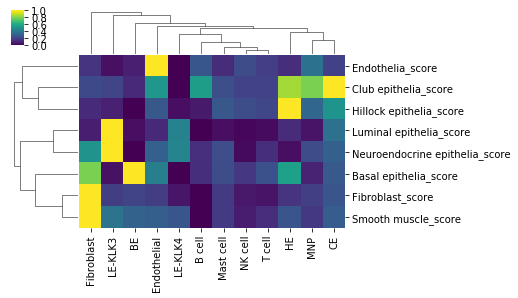

In [23]:
g = sns.clustermap(output.transpose(), standard_scale = 0, cmap="viridis", figsize=(6, 4))
if not os.path.exists('figures/heatmap/'):
    os.makedirs('figures/heatmap/')
g.savefig('figures/heatmap/henry_geneset_score.pdf')
# cbar = g.cax
# cbar.set_position([1.1, 0.35, 0.02, 0.15])
# g.ax_row_dendrogram.set_visible(False)
# g.ax_col_dendrogram.set_visible(False)

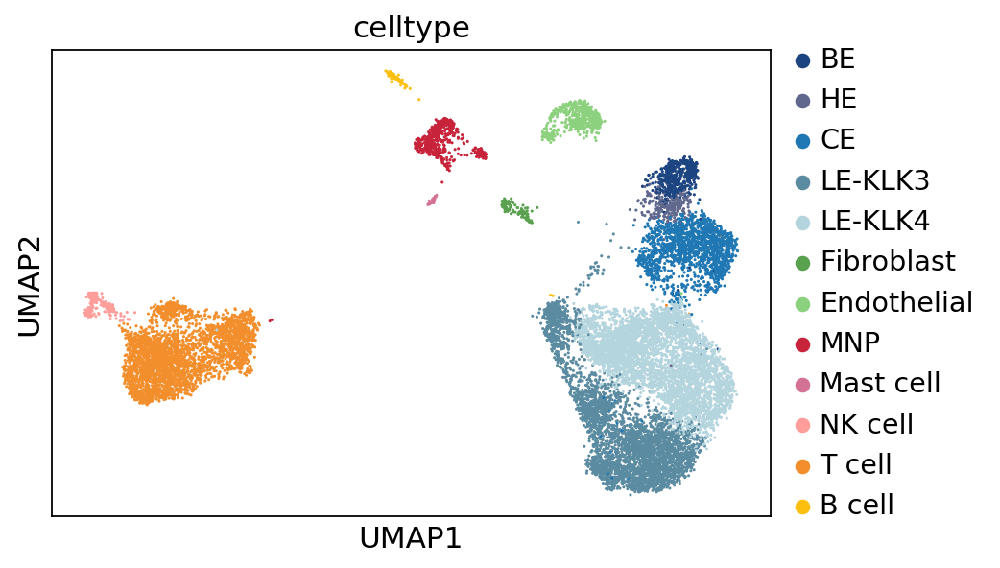

In [16]:
# also read in the unscaled file so that i make an embeddding for normal and tumor
results_b = 'out/prostate_raw.h5ad'
adata_b = sc.read_h5ad(results_b)
# transfer the normalized object to raw
adata_b.raw = adata_b
# replace the obs and uns slots
adata_b.obs = adata.obs
adata_b.uns = adata.uns
# remove sperm like the previous object
adata_b2 = adata_b[~adata_b.obs['celltype'].isin(['Sperm'])]
sc.pl.umap(adata_b2, color = 'celltype')

In [17]:
# split into normal and tumor
ndata = adata_b2[adata_b2.obs['group'].isin(['normal'])]
tdata = adata_b2[adata_b2.obs['group'].isin(['tumor'])]

In [18]:
ndata

View of AnnData object with n_obs × n_vars = 6862 × 21955 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'

In [19]:
tdata

View of AnnData object with n_obs × n_vars = 8630 × 21955 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'

In [20]:
import multiprocessing
def quick_process(adata):
    # Identify highly-variable genes.
    sc.pp.highly_variable_genes(adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
    # plot highly_variable_genes
    sc.pl.highly_variable_genes(adata)
    # Actually do the filtering.
    adata = adata[:, adata.var['highly_variable']]
    # regress and scale for PCA
    sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], n_jobs = multiprocessing.cpu_count()-1)
    sc.pp.scale(adata, max_value = 10)
    sc.tl.pca(adata, svd_solver = 'arpack')
    sc.pl.pca_variance_ratio(adata, log = True, n_pcs = 50)
    # Computing the batch corrected neighborhood graph with bbknn
    sc.external.pp.bbknn(adata, batch_key = 'patient')
    # rerun umap
    sc.tl.umap(adata, n_components = 2, min_dist = 0.5)
    return(adata)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, making a copy.


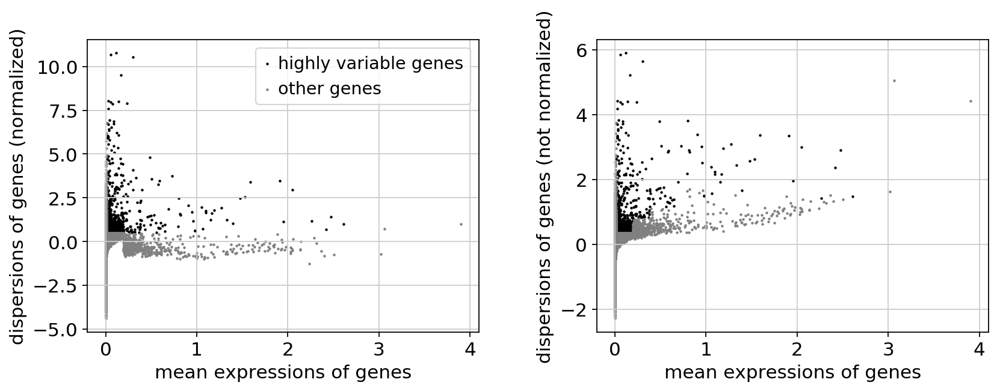

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:50)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:01)


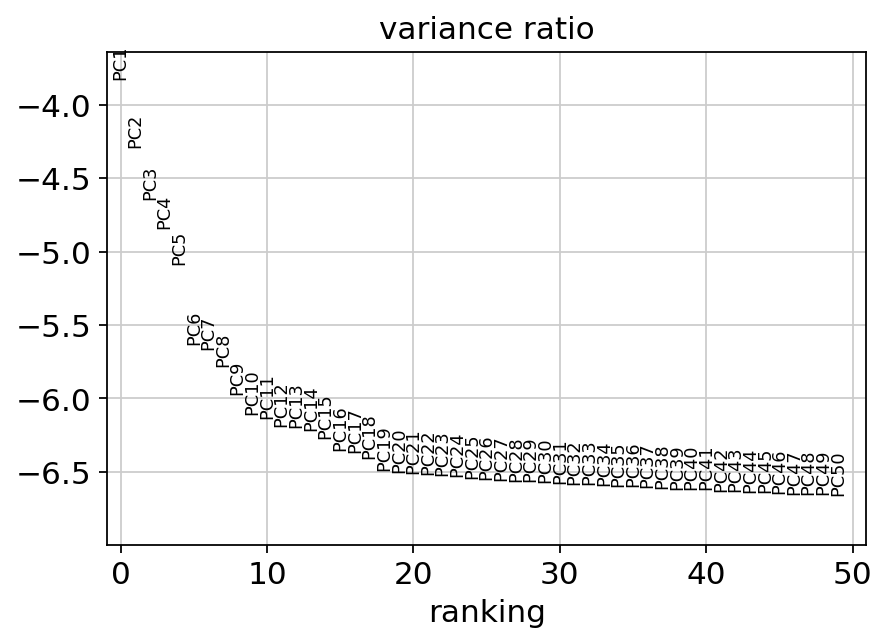

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)


In [21]:
ndata = quick_process(ndata)

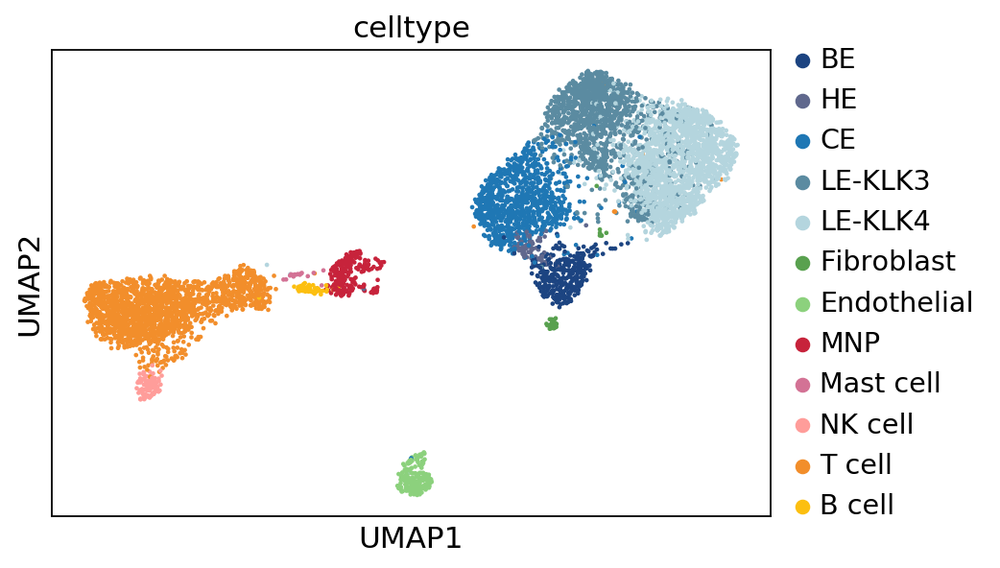

In [22]:
normal_file = 'out/prostate_normal.h5ad'
tumor_file = 'out/prostate_tumor.h5ad'

# ndata = sc.read_h5ad(normal_file)
# tdata = sc.read_h5ad(tumor_file)
sc.set_figure_params(figsize = [6.0, 4.0], vector_friendly = True, dpi_save = 3200)
sc.pl.umap(ndata, color = ['celltype'], save = '/normal_umap.pdf')

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, making a copy.


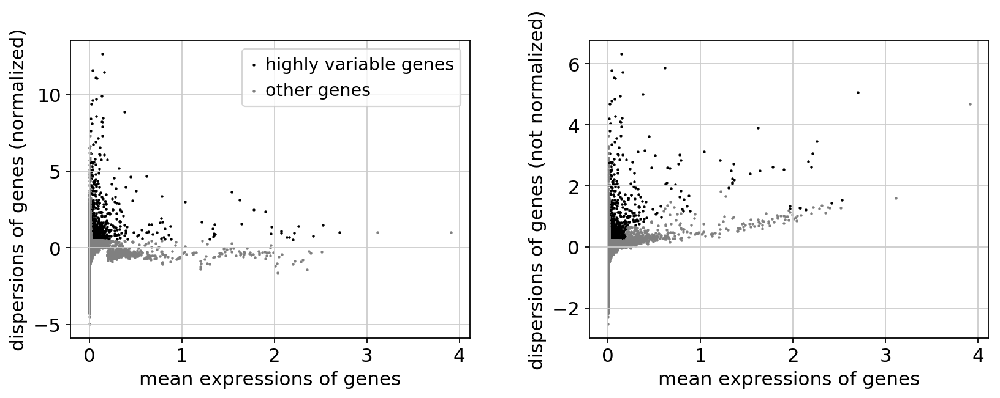

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:16)
computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:00)


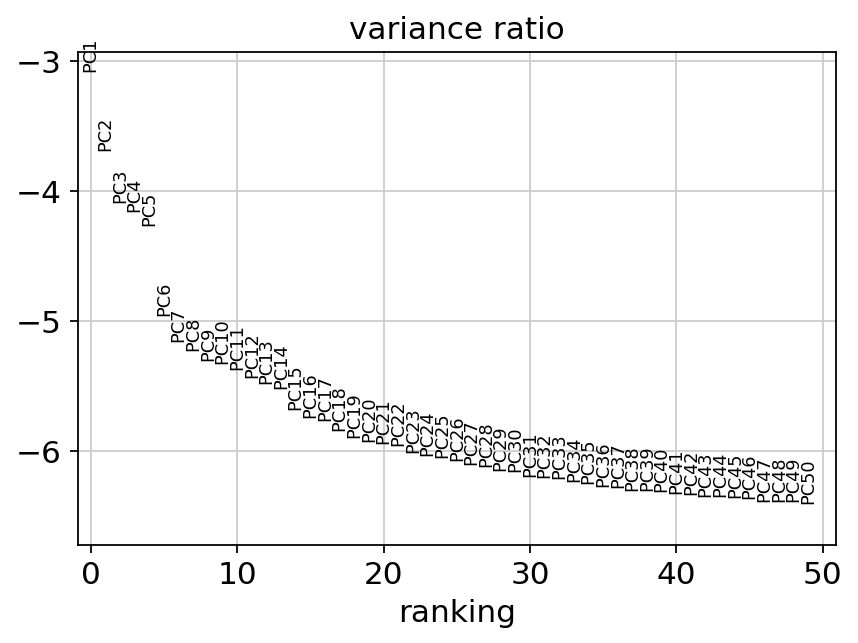

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:27)


In [23]:
tdata = quick_process(tdata)

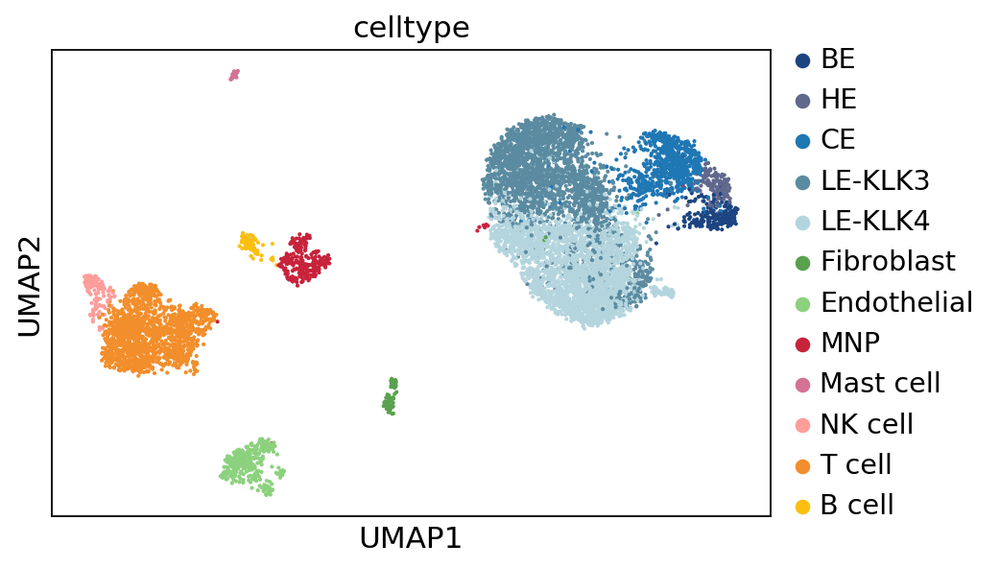

In [24]:
sc.pl.umap(tdata, color = ['celltype'], save ='/tumor_umap.pdf')

In [25]:
# save the objects
ndata.write('out/prostate_normal.h5ad', compression = 'gzip')
tdata.write('out/prostate_tumor.h5ad', compression = 'gzip')

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

normal_file = 'out/prostate_normal.h5ad'
tumor_file = 'out/prostate_tumor.h5ad'

ndata = sc.read_h5ad(normal_file)
tdata = sc.read_h5ad(tumor_file)

/home/jovyan/my-conda-envs/mypython3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


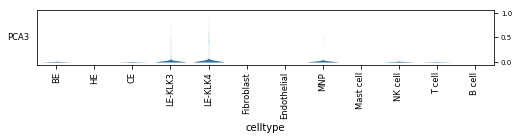

In [295]:
sc.pl.stacked_violin(ndata, ['PCA3'], groupby = 'celltype', size = 0, standard_scale = 'var', swap_axes = True, row_palette = '#1f77b4', linewidth = 0, figsize = (9,1), save = '/normal_PCA3.pdf')

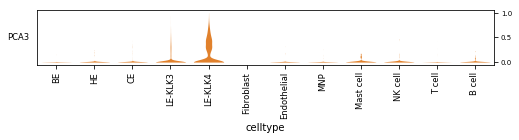

In [296]:
sc.pl.stacked_violin(tdata, ['PCA3'], groupby = 'celltype', size = 0, standard_scale = 'var', swap_axes = True, row_palette = '#ff7f0e', linewidth = 0, figsize = (9,1), save = '/tumor_PCA3.pdf')

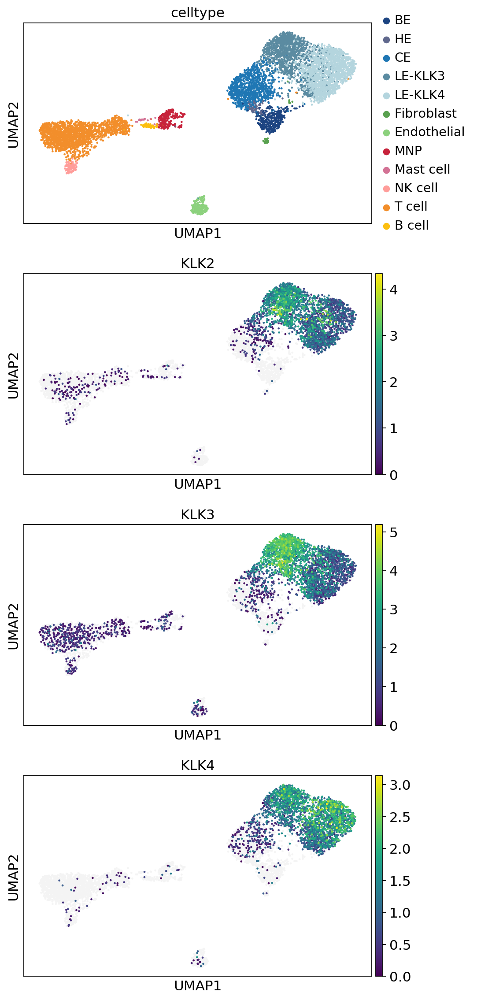

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([245/256, 245/256, 245/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)

sc.set_figure_params(figsize = [6.0, 4.0], vector_friendly = True, dpi_save = 900)
sc.pl.umap(ndata, color = ['celltype','KLK2', 'KLK3', 'KLK4'], ncols = 1, color_map = newcmp, save = '/useful markers_normal.pdf')

In [10]:
# sc.pl.umap(tdata, color = ['KLK2', 'KLK3', 'KLK4'], ncols = 2, size = 20, color_map = color_map = newcmp, save = '/useful markers_tumor.pdf')

In [17]:
### to perform GSEA of KLK3 vs KLK4, first do a wilcoxon test between them
ndata = ndata[ndata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4'])]
sc.tl.rank_genes_groups(ndata, groupby = 'celltype', n_genes = 30000, method = 'wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


In [18]:
def exportDEres(adata, column, filename):
    scores = pd.DataFrame(data = adata.uns['rank_genes_groups']['scores'][column], index = adata.uns['rank_genes_groups']['names'][column])
    lfc = pd.DataFrame(data = adata.uns['rank_genes_groups']['logfoldchanges'][column], index = adata.uns['rank_genes_groups']['names'][column])
    pvals = pd.DataFrame(data = adata.uns['rank_genes_groups']['pvals'][column], index = adata.uns['rank_genes_groups']['names'][column])
    padj = pd.DataFrame(data = adata.uns['rank_genes_groups']['pvals_adj'][column], index = adata.uns['rank_genes_groups']['names'][column])
    dfs = [scores, lfc, pvals, padj]
    df_final = functools.reduce(lambda left,right: pd.merge(left,right,left_index = True, right_index = True), dfs)
    df_final.columns = ['scores', 'logfoldchanges', 'pvals', 'pvals_adj']

    df_final.to_csv(filename, sep = '\t')  

In [19]:
outpath = 'out/DEG/'
if not os.path.exists(outpath):
        os.makedirs(outpath)
for x in ['LE-KLK3', 'LE-KLK4']:
    exportDEres(ndata, str(x), outpath+str(x)+'_normal.txt')

In [20]:
def rankList(deg_file, remove_ribo_mito = False):
    # read in the files and do some ranking calculations
    deg = pd.read_csv(deg_file, sep = '\t', index_col = 0)
    if remove_ribo_mito:
        # remove ribosomal and mitochondrial genes
        deg = deg[~deg.index.str.contains('RPS|RPL|MT-')]

    # convert to negative log10 pval
    deg['neglog10pval'] = [-1*np.log10(p) for p in deg['pvals']]
    # convert inf values to max machine number
    try:
        deg['neglog10pval'].replace(np.inf, -1*np.log10(10**-308), inplace = True)
    except:
        pass
    try:    
        deg['neglog10pval'].replace(-np.inf, -1*np.log10(10**308), inplace = True)
    except:
        pass
    deg['rank'] = [p*np.sign(lfc) for p, lfc in zip(deg['neglog10pval'], deg['logfoldchanges'])]
    deg = deg.reset_index(drop = False)
    return(deg[['index', 'rank']])

In [21]:
# quickly prep the files
klk3 = rankList('out/DEG/LE-KLK3_normal.txt', True)
klk4 = rankList('out/DEG/LE-KLK4_normal.txt', True)

In [ ]:
# run preranked gsea
import gseapy as gp
pre_res_klk3 = gp.prerank(rnk=klk3, 
                     gene_sets='./dataset/h.all.v7.0.symbols.gmt',
                     processes=4,
                     min_size=0,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk4 = gp.prerank(rnk=klk4, 
                     gene_sets='./dataset/h.all.v7.0.symbols.gmt',
                     processes=4,
                     min_size=0,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)

2020-04-09 13:07:03,720 Parsing data files for GSEA.............................
2020-04-09 13:07:06,083 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2020-04-09 13:07:06,085 0050 gene_sets used for further statistical testing.....
2020-04-09 13:07:06,086 Start to run GSEA...Might take a while..................
2020-04-09 13:07:24,571 Start to generate gseapy reports, and produce figures...
2020-04-09 13:07:24,594 Congratulations. GSEApy runs successfully................

2020-04-09 13:07:24,608 Parsing data files for GSEA.............................
2020-04-09 13:07:26,832 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2020-04-09 13:07:26,833 0050 gene_sets used for further statistical testing.....
2020-04-09 13:07:26,834 Start to run GSEA...Might take a while..................


In [ ]:
# save results
if not os.path.exists('out/GSEA/'):
    os.makedirs('out/GSEA/')
pre_res_klk3.res2d.to_csv('out/GSEA/KLK3_normal_hallmark_gsea.txt', sep='\t')
pre_res_klk4.res2d.to_csv('out/GSEA/KLK4_normal_hallmark_gsea.txt', sep='\t')

In [52]:
genesets = {'TNFa Signaling Via NFkB':['JUN','JUNB','PMEPA1','FOS','IER2','GADD45B','ZFP36','DUSP1','FOSB','ATF3'],
'Androgen Response':['KLK3','KLK2','AZGP1','B2M','TMPRSS2','PMEPA1','PLPP1','ELK4','DHCR24','ACSL3'],
'Estrogen Response Late':['CD9','CPE','XBP1','FOS','ZFP36','NBL1','ABHD2','PERP','CDH1','ELOVL5'],
'Interferon gamma response':['HLA-B','HLA-A','CD38','LGALS3BP','TXNIP','TNFSF10','BTG1','TAPBP','ARID5B'],
'MYC Target V1':['H2AFZ','EIF4A1','CDK4','FBL','RANBP1','RAD23B','YWHAE','TXNL4A','EIF3J','TCP1']}

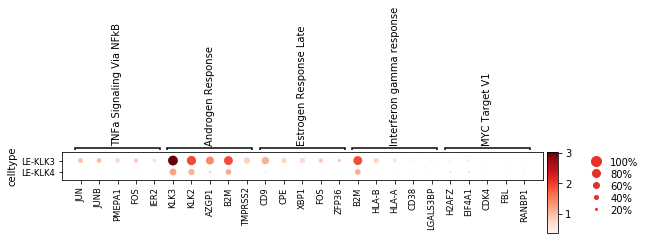

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[8.75, 0, 0.2, 0.5, 0.25])

In [50]:
sc.pl.dotplot(ndata,genesets, mean_only_expressed = True, groupby = 'celltype')

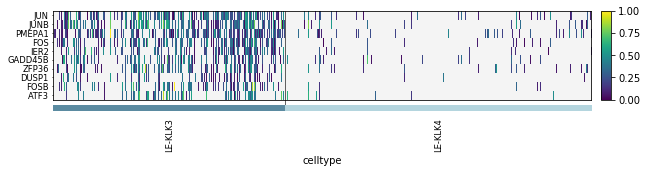

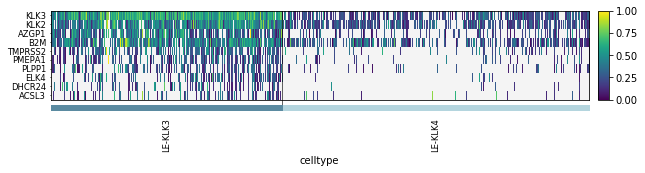

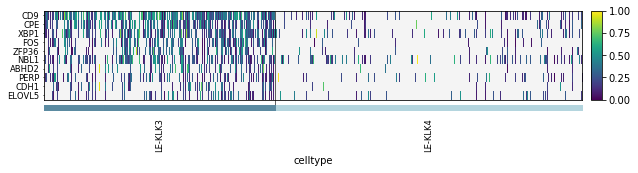

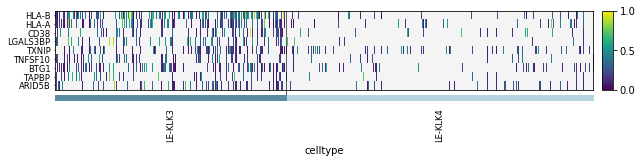

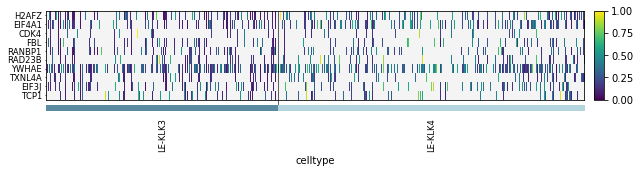

GridSpec(3, 3, height_ratios=[0, 1.7999999999999998, 0.13], width_ratios=[10, 0, 0.2])

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([245/256, 245/256, 245/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)

sc.pl.heatmap(ndata, genesets['TNFa Signaling Via NFkB'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_tnf_heatmap.pdf')
sc.pl.heatmap(ndata, genesets['Androgen Response'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_andro_heatmap.pdf')
sc.pl.heatmap(ndata, genesets['Estrogen Response Late'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_estro_heatmap.pdf')
sc.pl.heatmap(ndata, genesets['Interferon gamma response'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_ifng_heatmap.pdf')
sc.pl.heatmap(ndata, genesets['MYC Target V1'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_tnf_heatmap.pdf')

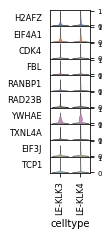

In [63]:
sc.pl.stacked_violin(ndata, genesets['MYC Target V1'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True)

In [1]:
### DEG of tumor vs normal
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)
adata = adata[~adata.obs['celltype'].isin(['Sperm'])]

/home/jovyan/my-conda-envs/mypython3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


In [5]:
# # subset to KLK3 and KLK4 as two objects
# klk3 = adata[adata.obs['celltype']=='LE-KLK3']
# klk4 = adata[adata.obs['celltype']=='LE-KLK4']

# sc.tl.rank_genes_groups(klk3, groupby = 'group', n_genes = 30000, method = 'wilcoxon')
# sc.tl.rank_genes_groups(klk4, groupby = 'group', n_genes = 30000, method = 'wilcoxon')

# def exportDEres(adata, column, filename):
#     scores = pd.DataFrame(data = adata.uns['rank_genes_groups']['scores'][column], index = adata.uns['rank_genes_groups']['names'][column])
#     lfc = pd.DataFrame(data = adata.uns['rank_genes_groups']['logfoldchanges'][column], index = adata.uns['rank_genes_groups']['names'][column])
#     pvals = pd.DataFrame(data = adata.uns['rank_genes_groups']['pvals'][column], index = adata.uns['rank_genes_groups']['names'][column])
#     padj = pd.DataFrame(data = adata.uns['rank_genes_groups']['pvals_adj'][column], index = adata.uns['rank_genes_groups']['names'][column])
#     dfs = [scores, lfc, pvals, padj]
#     df_final = functools.reduce(lambda left,right: pd.merge(left,right,left_index = True, right_index = True), dfs)
#     df_final.columns = ['scores', 'logfoldchanges', 'pvals', 'pvals_adj']

#     df_final.to_csv(filename, sep = '\t')

# outpath = 'out/DEG/tumor vs normal/full/'
# if not os.path.exists(outpath):
#         os.makedirs(outpath)
# exportDEres(klk3, str('tumor'), outpath+'LE-KLK3_tumor_vs_normal.txt')
# exportDEres(klk3, str('normal'), outpath+'LE-KLK3_normal_vs_tumor.txt')
# exportDEres(klk4, str('tumor'), outpath+'LE-KLK4_tumor_vs_normal.txt')
# exportDEres(klk4, str('normal'), outpath+'LE-KLK4_normal_vs_tumor.txt')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


In [2]:
def rankList(deg_file, remove_ribo_mito = False):
    # read in the files and do some ranking calculations
    deg = pd.read_csv(deg_file, sep = '\t', index_col = 0)
    if remove_ribo_mito:
        # remove ribosomal and mitochondrial genes
        deg = deg[~deg.index.str.contains('RPS|RPL|MT-')]

    # convert to negative log10 pval
    deg['neglog10pval'] = [-1*np.log10(p) for p in deg['pvals']]
    # convert inf values to max machine number
    try:
        deg['neglog10pval'].replace(np.inf, -1*np.log10(10**-308), inplace = True)
    except:
        pass
    try:    
        deg['neglog10pval'].replace(-np.inf, -1*np.log10(10**308), inplace = True)
    except:
        pass
    deg['rank'] = [p*np.sign(lfc) for p, lfc in zip(deg['neglog10pval'], deg['logfoldchanges'])]
    deg = deg.reset_index(drop = False)
    return(deg[['index', 'rank']])

# quickly prep the files
# klk3_n = rankList('out/DEG/tumor vs normal/full/LE-KLK3_normal_vs_tumor.txt', True)
# klk4_n = rankList('out/DEG/tumor vs normal/full/LE-KLK4_normal_vs_tumor.txt', True)
klk3_t = rankList('out/DEG/tumor vs normal/full/LE-KLK3_tumor_vs_normal.txt', True)
klk4_t = rankList('out/DEG/tumor vs normal/full/LE-KLK4_tumor_vs_normal.txt', True)

In [26]:
if not os.path.exists('out/GSEA/'):
    os.makedirs('out/GSEA/')
# run preranked gsea
import gseapy as gp
# pre_res_klk3_n = gp.prerank(rnk=klk3_n, 
#                      gene_sets='./dataset/c2.cp.kegg.v7.0.symbols.gmt',
#                      processes=20,
#                      min_size=15,
#                      max_size=500,
#                      permutation_num=1000, # reduce number to speed up testing
#                      no_plot=True,
#                      verbose=True)
# pre_res_klk4_n = gp.prerank(rnk=klk4_n, 
#                      gene_sets='./dataset/c2.cp.kegg.v7.0.symbols.gmt',
#                      processes=20,
#                      min_size=15,
#                      max_size=500,
#                      permutation_num=1000, # reduce number to speed up testing
#                      no_plot=True,
#                      verbose=True)
pre_res_klk3_t = gp.prerank(rnk=klk3_t, 
                     gene_sets='./dataset/c2.cp.kegg.v7.0.symbols.gmt',
                     processes=20,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk4_t = gp.prerank(rnk=klk4_t, 
                     gene_sets='./dataset/c2.cp.kegg.v7.0.symbols.gmt',
                     processes=20,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk3_n.res2d.to_csv('out/GSEA/KLK3_normal_vs_tumor_kegg_gsea.txt', sep='\t')
pre_res_klk4_n.res2d.to_csv('out/GSEA/KLK4_normal_vs_tumor_kegg_gsea.txt', sep='\t')
pre_res_klk3_t.res2d.to_csv('out/GSEA/KLK3_tumor_vs_normal_kegg_gsea.txt', sep='\t')
pre_res_klk4_t.res2d.to_csv('out/GSEA/KLK4_tumor_vs_normal_kegg_gsea.txt', sep='\t')

2020-03-16 12:59:50,850 Parsing data files for GSEA.............................
2020-03-16 12:59:55,431 0013 gene_sets have been filtered out when max_size=500 and min_size=15
2020-03-16 12:59:55,432 0173 gene_sets used for further statistical testing.....
2020-03-16 12:59:55,433 Start to run GSEA...Might take a while..................
2020-03-16 13:01:18,723 Start to generate gseapy reports, and produce figures...
2020-03-16 13:01:18,805 Congratulations. GSEApy runs successfully................

2020-03-16 13:01:18,978 Parsing data files for GSEA.............................
2020-03-16 13:01:23,534 0013 gene_sets have been filtered out when max_size=500 and min_size=15
2020-03-16 13:01:23,536 0173 gene_sets used for further statistical testing.....
2020-03-16 13:01:23,538 Start to run GSEA...Might take a while..................
2020-03-16 13:02:08,884 Start to generate gseapy reports, and produce figures...
2020-03-16 13:02:08,940 Congratulations. GSEApy runs successfully............

In [27]:
if not os.path.exists('out/GSEA/'):
    os.makedirs('out/GSEA/')
# run preranked gsea
import gseapy as gp
# pre_res_klk3_n = gp.prerank(rnk=klk3_n, 
#                      gene_sets='./dataset/c2.cp.reactome.v7.0.symbols.gmt',
#                      processes=20,
#                      min_size=15,
#                      max_size=500,
#                      permutation_num=1000, # reduce number to speed up testing
#                      no_plot=True,
#                      verbose=True)
# pre_res_klk4_n = gp.prerank(rnk=klk4_n, 
#                      gene_sets='./dataset/c2.cp.reactome.v7.0.symbols.gmt',
#                      processes=20,
#                      min_size=15,
#                      max_size=500,
#                      permutation_num=1000, # reduce number to speed up testing
#                      no_plot=True,
#                      verbose=True)
pre_res_klk3_t = gp.prerank(rnk=klk3_t, 
                     gene_sets='./dataset/c2.cp.reactome.v7.0.symbols.gmt',
                     processes=20,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk4_t = gp.prerank(rnk=klk4_t, 
                     gene_sets='./dataset/c2.cp.reactome.v7.0.symbols.gmt',
                     processes=20,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
# pre_res_klk3_n.res2d.to_csv('out/GSEA/KLK3_normal_vs_tumor_reactome_gsea.txt', sep='\t')
# pre_res_klk4_n.res2d.to_csv('out/GSEA/KLK4_normal_vs_tumor_reactome_gsea.txt', sep='\t')
pre_res_klk3_t.res2d.to_csv('out/GSEA/KLK3_tumor_vs_normal_reactome_gsea.txt', sep='\t')
pre_res_klk4_t.res2d.to_csv('out/GSEA/KLK4_tumor_vs_normal_reactome_gsea.txt', sep='\t')

2020-03-16 13:03:12,662 Parsing data files for GSEA.............................
2020-03-16 13:03:41,329 0588 gene_sets have been filtered out when max_size=500 and min_size=15
2020-03-16 13:03:41,331 0911 gene_sets used for further statistical testing.....
2020-03-16 13:03:41,332 Start to run GSEA...Might take a while..................
2020-03-16 13:13:23,292 Start to generate gseapy reports, and produce figures...
2020-03-16 13:13:23,755 Congratulations. GSEApy runs successfully................

2020-03-16 13:13:23,809 Parsing data files for GSEA.............................
2020-03-16 13:13:50,482 0588 gene_sets have been filtered out when max_size=500 and min_size=15
2020-03-16 13:13:50,486 0911 gene_sets used for further statistical testing.....
2020-03-16 13:13:50,488 Start to run GSEA...Might take a while..................
2020-03-16 13:23:27,576 Start to generate gseapy reports, and produce figures...
2020-03-16 13:23:28,253 Congratulations. GSEApy runs successfully............

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)
adata = adata[~adata.obs['celltype'].isin(['Sperm'])]

/home/jovyan/my-conda-envs/mypython3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


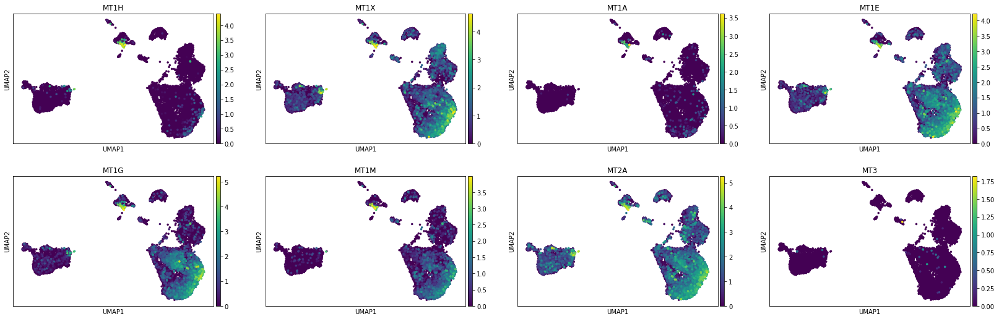

In [4]:
sc.pl.umap(adata, color = ['MT1H', 'MT1X', 'MT1A', 'MT1E', 'MT1G','MT1M', 'MT2A', 'MT3'], size = 50)

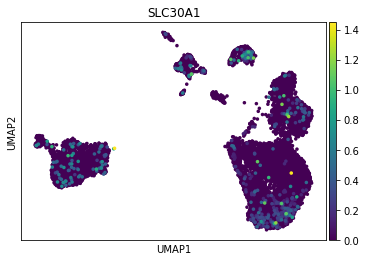

In [28]:
sc.pl.umap(adata, color = ['SLC30A1'], size = 50)

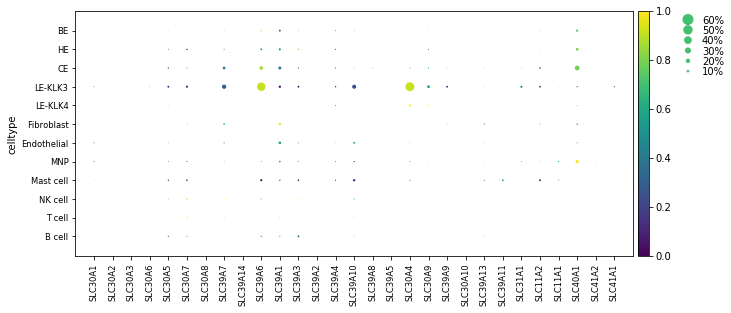

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[10.149999999999999, 0, 0.2, 0.5, 0.25])

In [79]:
metalion_transport = ['SLC30A1', 'SLC30A2', 'SLC30A3', 'SLC30A6', 'SLC30A5', 'SLC30A7', 'SLC30A8', 'SLC39A7', 'SLC39A14', 'SLC39A6', 'SLC39A1', 'SLC39A3', 'SLC39A2', 'SLC39A4', 'SLC39A10', 'SLC39A8', 'SLC39A5', 'SLC30A4', 'SLC30A9', 'SLC39A9', 'SLC30A10', 'SLC39A13', 'SLC39A11', 'SLC31A1', 'SLC11A2', 'SLC11A1', 'SLC40A1', 'SLC41A2', 'SLC41A1']
sc.pl.dotplot(adata, metalion_transport, groupby = 'celltype', mean_only_expressed = True, standard_scale = 'var', color_map = 'viridis')

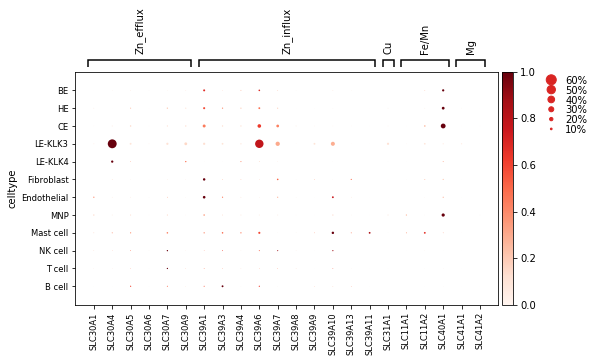

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[7.699999999999999, 0, 0.2, 0.5, 0.25])

In [2]:
metal_ion_transport = {'Zn_efflux':['SLC30A1', 'SLC30A4', 'SLC30A5', 'SLC30A6', 'SLC30A7', 'SLC30A9'], 'Zn_influx':['SLC39A1', 'SLC39A3', 'SLC39A4', 'SLC39A6', 'SLC39A7', 'SLC39A8','SLC39A9', 'SLC39A10', 'SLC39A13', 'SLC39A11'], 'Cu':['SLC31A1'], 'Fe/Mn':['SLC11A1','SLC11A2' ,'SLC40A1'],  'Mg':['SLC41A1','SLC41A2']}
Zn_transport = {'Zn_efflux':['SLC30A1', 'SLC30A4', 'SLC30A5', 'SLC30A6', 'SLC30A7', 'SLC30A9'], 'Zn_influx':['SLC39A1', 'SLC39A3', 'SLC39A4', 'SLC39A6', 'SLC39A7', 'SLC39A8','SLC39A9', 'SLC39A10', 'SLC39A13', 'SLC39A11']}
Other_transport = {'Cu':['''SLC31A1'], 'Fe/Mn':['SLC11A1','SLC11A2' ,'SLC40A1'], 'Mg':['SLC41A1','SLC41A2']}
sc.pl.dotplot(adata, metal_ion_transport, groupby = 'celltype', standard_scale ='group')

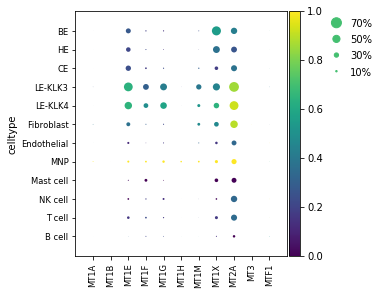

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.8499999999999996, 0, 0.2, 0.5, 0.25])

In [81]:
Zn_bind = ['MT1A', 'MT1B', 'MT1E', 'MT1F', 'MT1G', 'MT1H', 'MT1M', 'MT1X', 'MT2A', 'MT3', 'MTF1']
sc.pl.dotplot(adata, Zn_bind, groupby = 'celltype', mean_only_expressed = True, standard_scale = 'var', color_map = 'viridis')

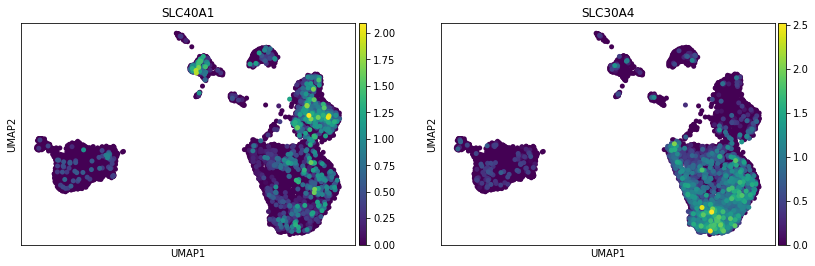

In [74]:
sc.pl.umap(adata, color = ['SLC40A1', 'SLC30A4'], size = 100)

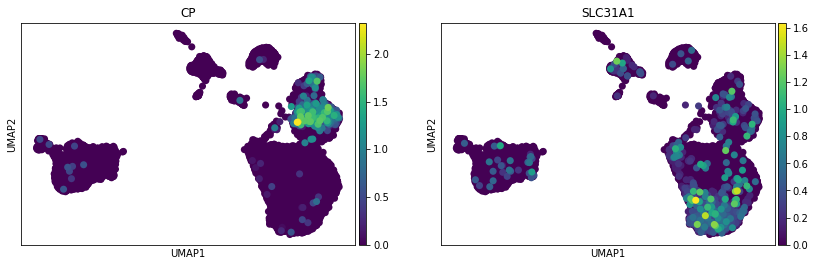

In [35]:
sc.pl.umap(adata, color = ['CP', 'SLC31A1'], size = 200)

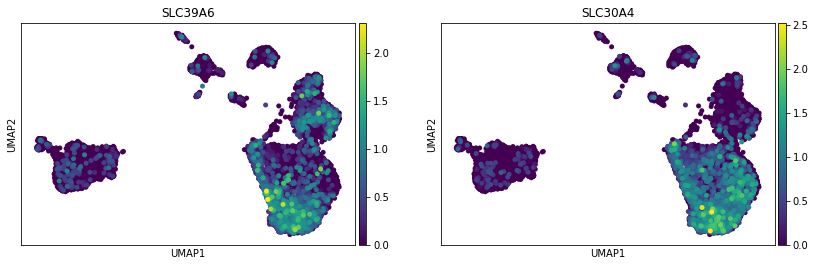

In [31]:
sc.pl.umap(adata, color = ['SLC39A6', 'SLC30A4'], size = 100)

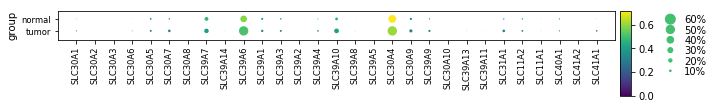

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[10.149999999999999, 0, 0.2, 0.5, 0.25])

In [67]:
klk3 = adata[adata.obs['celltype'] == 'LE-KLK3']
sc.pl.dotplot(klk3, Zn_transport, groupby = 'group', mean_only_expressed = True, color_map = 'viridis')

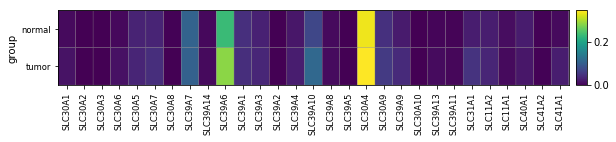

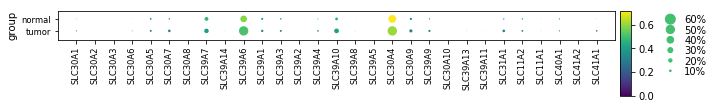

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[10.149999999999999, 0, 0.2, 0.5, 0.25])

In [68]:
klk3 = adata[adata.obs['celltype'] == 'LE-KLK3']
sc.pl.matrixplot(klk3, Zn_transport, groupby = 'group', cmap = 'viridis')
sc.pl.dotplot(klk3, Zn_transport, groupby = 'group', mean_only_expressed = True, color_map = 'viridis')

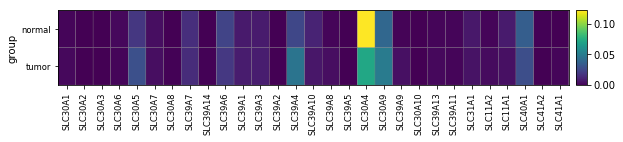

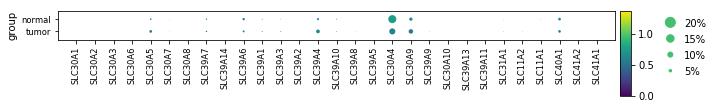

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[10.149999999999999, 0, 0.2, 0.5, 0.25])

In [69]:
klk4 = adata[adata.obs['celltype'] == 'LE-KLK4']
sc.pl.matrixplot(klk4, Zn_transport, groupby = 'group', cmap = 'viridis')
sc.pl.dotplot(klk4, Zn_transport, groupby = 'group', mean_only_expressed = True, color_map = 'viridis')

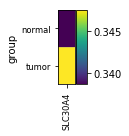

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[0.32, 0, 0.2])

In [61]:
sc.pl.matrixplot(klk3, 'SLC30A4', groupby = 'group')

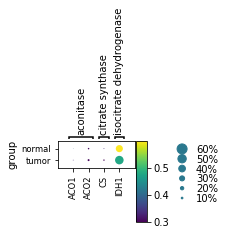

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[1.4, 0, 0.2, 0.5, 0.25])

In [87]:
kreb = {'aconitase':['ACO1', 'ACO2'], 'citrate synthase':['CS'], 'isocitrate dehydrogenase':['IDH1']}
sc.pl.dotplot(klk3, kreb, groupby = 'group', mean_only_expressed = True, color_map = 'viridis')

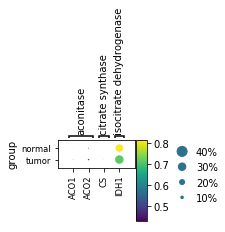

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[1.4, 0, 0.2, 0.5, 0.25])

In [88]:
sc.pl.dotplot(klk4, kreb, groupby = 'group', mean_only_expressed = True, color_map = 'viridis')

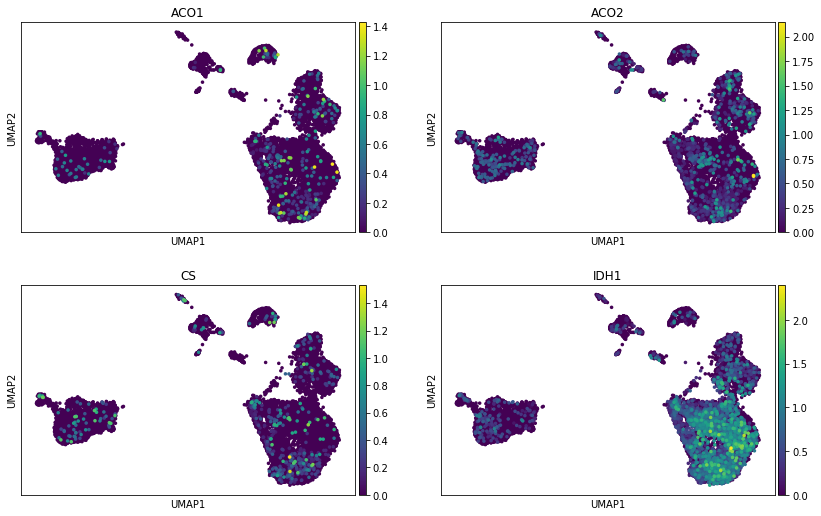

In [92]:
sc.pl.umap(adata, color = ['ACO1', 'ACO2', 'CS', 'IDH1'], ncols = 2, size = 50)

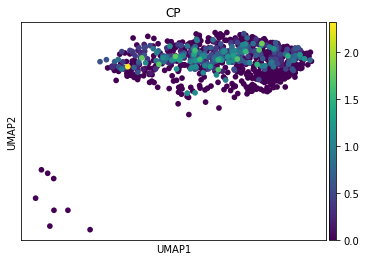

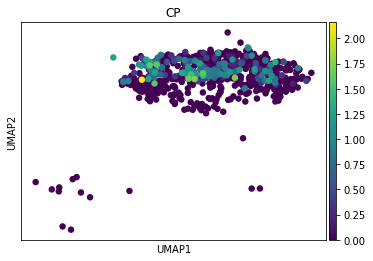

In [35]:
sc.pl.umap(adata[(adata.obs['group'] == 'normal') &(adata.obs['celltype'] == 'CE')], color = ['CP'])
sc.pl.umap(adata[(adata.obs['group'] == 'tumor') &(adata.obs['celltype'] == 'CE')], color = ['CP'])

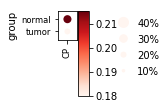

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[0.35, 0, 0.2, 0.5, 0.25])

In [37]:
sc.pl.dotplot(adata[adata.obs['celltype'] == 'CE'], ['CP'], groupby = 'group',)

In [13]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)
adata = adata[~adata.obs['celltype'].isin(['Sperm'])]
adata

scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


View of AnnData object with n_obs × n_vars = 15492 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

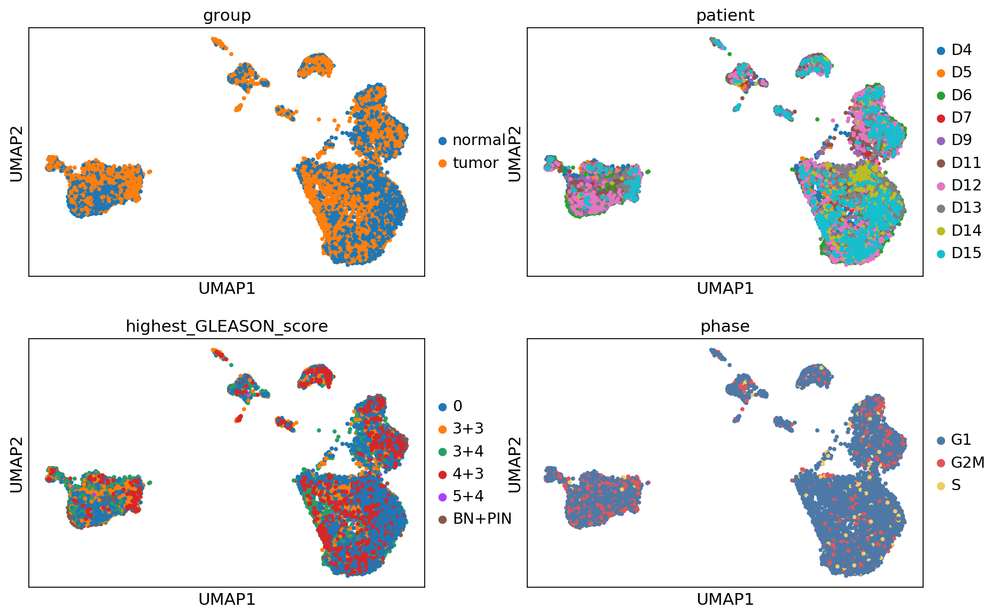

In [34]:
# subset to epithelial
# adata = adata[adata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4', 'BE', 'HE', 'CE'])]
sc.set_figure_params(vector_friendly=True, dpi_save=900, figsize = (6,4))
sc.pl.umap(adata, color = ['group', 'patient', 'highest_GLEASON_score', 'phase'], size = 50, ncols = 2, save = '/metainfo_umap.pdf')

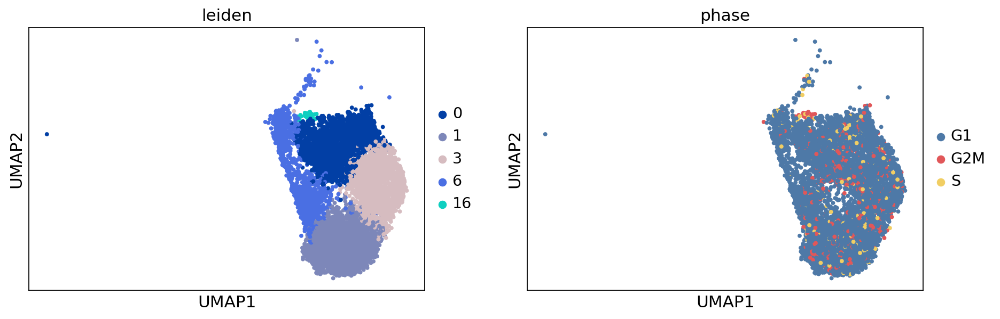

In [38]:
adata3 =adata2[adata2.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4'])]
sc.pl.umap(adata3, color = ['leiden', 'phase'], size = 50, ncols = 2, save = '/LE_leiden_phase_umap.pdf')

... storing 'celltype_group' as categorical


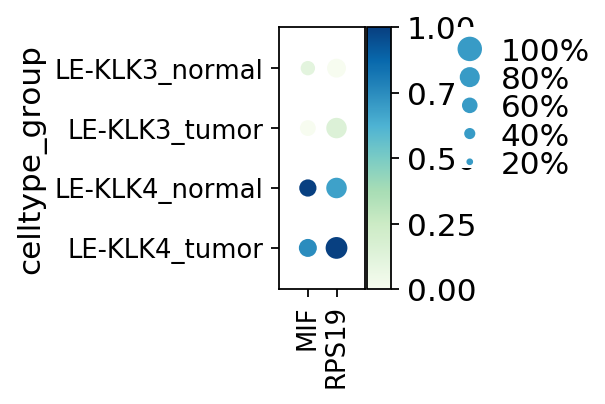

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[0.7, 0, 0.2, 0.5, 0.25])

In [44]:
adata3.obs['celltype_group'] = [c+'_'+g for g,c in zip(adata3.obs['group'],adata3.obs['celltype'])]
sc.pl.dotplot(adata3, ['MIF','RPS19'], groupby = 'celltype_group', color_map = 'GnBu', save = '/LE_MIF_RPS19_dotplot.pdf', standard_scale = 'var')

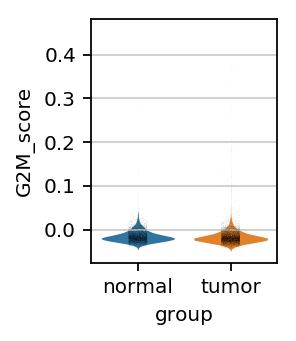

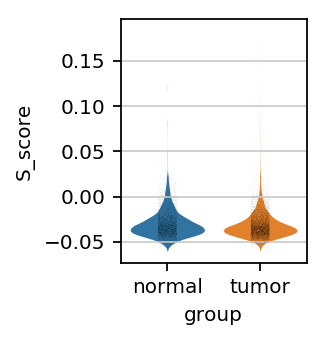

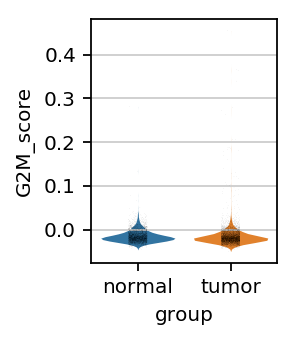

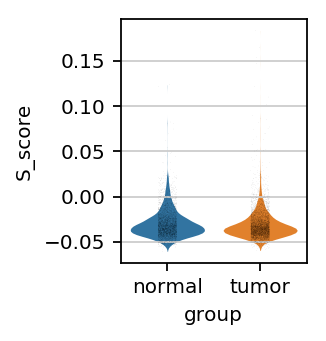

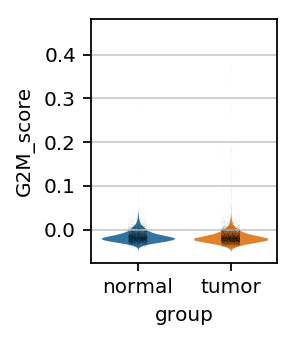

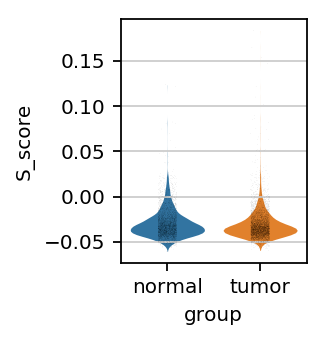

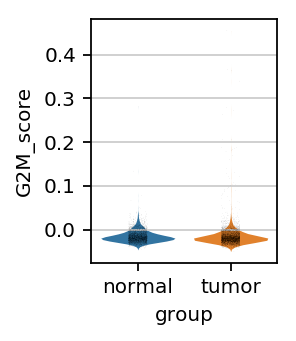

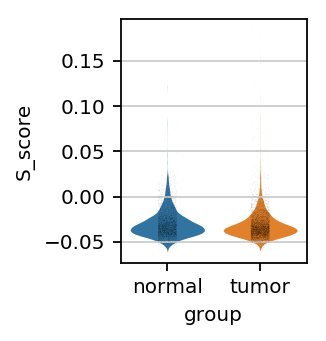

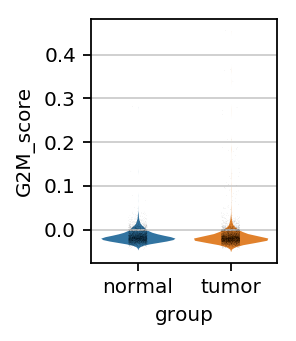

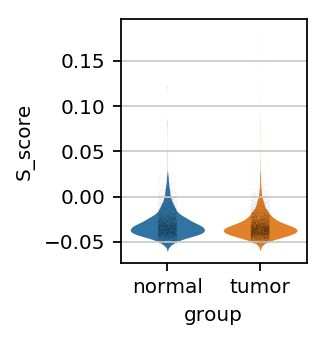

In [10]:
sc.set_figure_params(vector_friendly=True, dpi_save=300, fontsize=9,figsize=(2.5,2))
for ct in list(set(adata.obs['celltype'])):
    adatax = adata[adata.obs['celltype'] == ct]
    sc.pl.violin(adata, ['G2M_score'], groupby = 'group', size = 0.1, save = '/'+str(ct)+'_G2M_score.pdf', linewidth = 0)
    sc.pl.violin(adata, ['S_score'], groupby = 'group', size = 0.1, save = '/'+str(ct)+'_S_score.pdf', linewidth = 0)

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)
adata = adata[~adata.obs['celltype'].isin(['Sperm'])]
adata

/home/jovyan/my-conda-envs/mypython3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


View of AnnData object with n_obs × n_vars = 15492 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

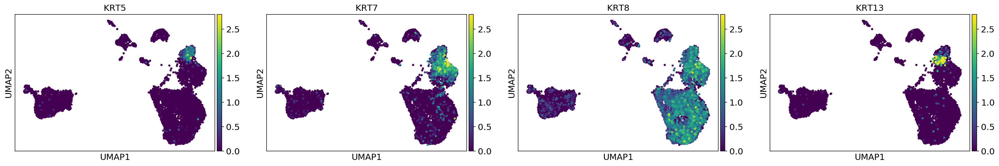

In [19]:
# adata = adata[adata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4', 'BE', 'HE', 'CE'])]
sc.set_figure_params(vector_friendly=True, dpi_save=900, figsize = (6,4))
sc.pl.umap(adata, color = ['KRT5', 'KRT7', 'KRT8', 'KRT13'], vmax = 2.8, size = 50, save = '/keratins.pdf')

Trying to set attribute `.obs` of view, making a copy.
... storing 'celltype_group' as categorical


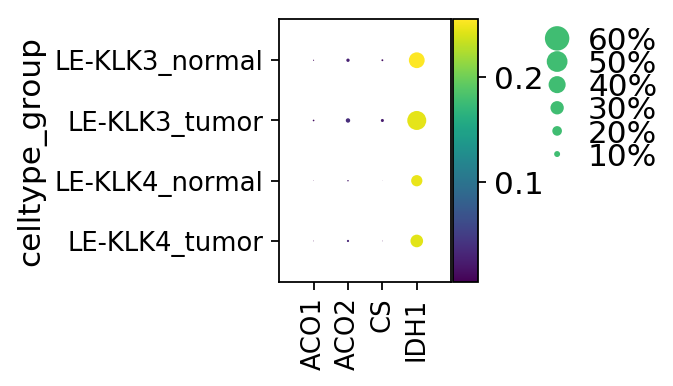

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.4, 0, 0.2, 0.5, 0.25])

In [40]:
edata = adata[adata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4'])]
edata.obs['celltype_group'] = [c+'_'+g for g,c in zip(edata.obs['group'],edata.obs['celltype'])]
sc.pl.dotplot(edata, ['ACO1', 'ACO2', 'CS', 'IDH1'], groupby = 'celltype_group', color_map = 'viridis')

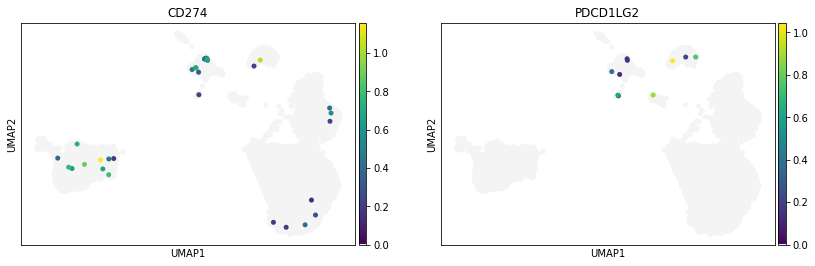

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([245/256, 245/256, 245/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)
sc.pl.umap(adata, color = ['CD274', 'PDCD1LG2'], vmaxsize = 100, color_map = newcmp)

In [4]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

def rankList(deg_file, remove_ribo_mito = False):
    # read in the files and do some ranking calculations
    deg = pd.read_csv(deg_file, sep = '\t', index_col = 0)
    if remove_ribo_mito:
        # remove ribosomal and mitochondrial genes
        deg = deg[~deg.index.str.contains('^RPS|^RPL|^MRPL|^MRPS|^MT-')]

    # convert to negative log10 pval
    deg['neglog10pval'] = [-1*np.log10(p) for p in deg['pvals']]
    # convert inf values to max machine number
    try:
        deg['neglog10pval'].replace(np.inf, -1*np.log10(10**-308), inplace = True)
    except:
        pass
    try:    
        deg['neglog10pval'].replace(-np.inf, -1*np.log10(10**308), inplace = True)
    except:
        pass
    deg['rank'] = [p*np.sign(lfc) for p, lfc in zip(deg['neglog10pval'], deg['logfoldchanges'])]
    deg = deg.reset_index(drop = False)
    return(deg[['index', 'rank']])

# quickly prep the files
klk4_t = rankList('out/DEG/tumor vs normal/full/LE-KLK4_tumor_vs_normal.txt', True)

import gseapy as gp
pre_res_klk4_t = gp.prerank(rnk=klk4_t, 
                     gene_sets='./dataset/c2.cp.kegg.v7.0.symbols.gmt',
                     processes=20,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)

2020-04-09 15:43:24,037 Parsing data files for GSEA.............................


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


2020-04-09 15:43:27,953 0013 gene_sets have been filtered out when max_size=500 and min_size=15
2020-04-09 15:43:27,955 0173 gene_sets used for further statistical testing.....
2020-04-09 15:43:27,955 Start to run GSEA...Might take a while..................
2020-04-09 15:43:47,050 Start to generate gseapy reports, and produce figures...
2020-04-09 15:43:49,224 Congratulations. GSEApy runs successfully................



In [5]:
klk3_t = rankList('out/DEG/tumor vs normal/full/LE-KLK3_tumor_vs_normal.txt', True)
pre_res_klk3_t = gp.prerank(rnk=klk3_t, 
                     gene_sets='./dataset/c2.cp.kegg.v7.0.symbols.gmt',
                     processes=20,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)

2020-04-09 15:48:36,628 Parsing data files for GSEA.............................
2020-04-09 15:48:40,753 0013 gene_sets have been filtered out when max_size=500 and min_size=15
2020-04-09 15:48:40,754 0173 gene_sets used for further statistical testing.....
2020-04-09 15:48:40,755 Start to run GSEA...Might take a while..................
2020-04-09 15:49:12,448 Start to generate gseapy reports, and produce figures...
2020-04-09 15:49:12,490 Congratulations. GSEApy runs successfully................



In [6]:
pre_res_klk3_t.res2d.to_csv('out/GSEA/KLK3_tumor_vs_normal_kegg_gsea.txt', sep='\t')
pre_res_klk4_t.res2d.to_csv('out/GSEA/KLK4_tumor_vs_normal_kegg_gsea.txt', sep='\t')

In [8]:
pre_res_klk3_t = gp.prerank(rnk=klk3_t, 
                     gene_sets='./dataset/c2.cp.reactome.v7.0.symbols.gmt',
                     processes=10,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk4_t = gp.prerank(rnk=klk4_t, 
                     gene_sets='./dataset/c2.cp.reactome.v7.0.symbols.gmt',
                     processes=10,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk3_t.res2d.to_csv('out/GSEA/KLK3_tumor_vs_normal_reactome_gsea.txt', sep='\t')
pre_res_klk4_t.res2d.to_csv('out/GSEA/KLK4_tumor_vs_normal_reactome_gsea.txt', sep='\t')

2020-04-09 16:02:35,767 Parsing data files for GSEA.............................
2020-04-09 16:03:03,511 0588 gene_sets have been filtered out when max_size=500 and min_size=15
2020-04-09 16:03:03,513 0911 gene_sets used for further statistical testing.....
2020-04-09 16:03:03,514 Start to run GSEA...Might take a while..................
2020-04-09 16:16:25,635 Start to generate gseapy reports, and produce figures...
2020-04-09 16:16:25,989 Congratulations. GSEApy runs successfully................

2020-04-09 16:16:26,015 Parsing data files for GSEA.............................
2020-04-09 16:16:52,794 0588 gene_sets have been filtered out when max_size=500 and min_size=15
2020-04-09 16:16:52,796 0911 gene_sets used for further statistical testing.....
2020-04-09 16:16:52,797 Start to run GSEA...Might take a while..................
2020-04-09 16:32:09,416 Start to generate gseapy reports, and produce figures...
2020-04-09 16:32:10,047 Congratulations. GSEApy runs successfully............

In [10]:
pre_res_klk4_t = gp.prerank(rnk=klk4_t, 
                     gene_sets='./dataset/c5.bp.v7.0.symbols.gmt',
                     processes=10,
                     min_size=15,
                     max_size=500,
                     permutation_num=100, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk3_t.res2d.to_csv('out/GSEA/KLK4_tumor_vs_normal_GO_gsea.txt', sep='\t')

2020-04-10 11:01:20,010 Parsing data files for GSEA.............................
2020-04-10 11:04:39,088 3525 gene_sets have been filtered out when max_size=500 and min_size=15
2020-04-10 11:04:39,090 3825 gene_sets used for further statistical testing.....
2020-04-10 11:04:39,091 Start to run GSEA...Might take a while..................
2020-04-10 11:06:04,800 Start to generate gseapy reports, and produce figures...
2020-04-10 11:06:05,753 Congratulations. GSEApy runs successfully................



In [11]:
pre_res_klk4_t = gp.prerank(rnk=klk3_t, 
                     gene_sets='./dataset/c5.bp.v7.0.symbols.gmt',
                     processes=10,
                     min_size=15,
                     max_size=500,
                     permutation_num=100, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk3_t.res2d.to_csv('out/GSEA/KLK3_tumor_vs_normal_GO_gsea.txt', sep='\t')

2020-04-10 11:09:12,862 Parsing data files for GSEA.............................
2020-04-10 11:12:41,055 3525 gene_sets have been filtered out when max_size=500 and min_size=15
2020-04-10 11:12:41,058 3825 gene_sets used for further statistical testing.....
2020-04-10 11:12:41,059 Start to run GSEA...Might take a while..................
2020-04-10 11:13:43,482 Start to generate gseapy reports, and produce figures...
2020-04-10 11:13:44,485 Congratulations. GSEApy runs successfully................



In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


In [2]:
pd.crosstab(adata.obs['sample'], adata.obs['group'])

group,normal,tumor
sample,,
SLX-15732SIGAC4HTVNWBBXXs_6,0,1887
SLX-15732SIGAD4HTVNWBBXXs_6,2687,0
SLX-15736SIGAA9HTHM2BBXXs_4,0,838
SLX-15736SIGAA9HTHM2BBXXs_5,0,841
SLX-15736SIGAB9HTHM2BBXXs_4,1064,0
SLX-15736SIGAB9HTHM2BBXXs_5,1056,0
SLX-15736SIGAD8HTHM2BBXXs_4,0,857
SLX-15736SIGAD8HTHM2BBXXs_5,0,844
SLX-15736SIGAE8HTHM2BBXXs_4,250,0


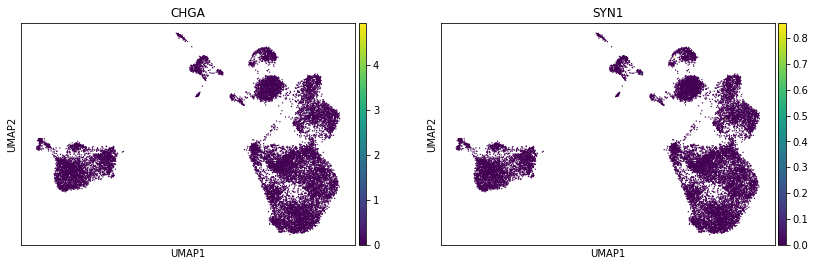

In [5]:
sc.pl.umap(adata, color = ['CHGA', 'SYN1'])

In [7]:
def rankList(deg_file, remove_ribo_mito = False):
    # read in the files and do some ranking calculations
    deg = pd.read_csv(deg_file, sep = '\t', index_col = 0)
    if remove_ribo_mito:
        # remove ribosomal and mitochondrial genes
        deg = deg[~deg.index.str.contains('^RPS|^RPL|^MRPL|^MRPS|^MT-')]

    # convert to negative log10 pval
    deg['neglog10pval'] = [-1*np.log10(p) for p in deg['pvals']]
    # convert inf values to max machine number
    try:
        deg['neglog10pval'].replace(np.inf, -1*np.log10(10**-308), inplace = True)
    except:
        pass
    try:    
        deg['neglog10pval'].replace(-np.inf, -1*np.log10(10**308), inplace = True)
    except:
        pass
    deg['rank'] = [p*np.sign(lfc) for p, lfc in zip(deg['neglog10pval'], deg['logfoldchanges'])]
    deg = deg.reset_index(drop = False)
    return(deg[['index', 'rank']])

# quickly prep the files
klk3 = rankList('out/DEG/LE-KLK3_normal.txt', True)
klk4 = rankList('out/DEG/LE-KLK4_normal.txt', True)

import gseapy as gp
pre_res_klk4 = gp.prerank(rnk=klk4, 
                     gene_sets='./dataset/c2.cp.kegg.v7.0.symbols.gmt',
                     processes=20,
                     min_size=15,
                     max_size=500,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)

2020-04-19 18:15:33,630 Parsing data files for GSEA.............................
2020-04-19 18:15:40,235 0013 gene_sets have been filtered out when max_size=500 and min_size=15
2020-04-19 18:15:40,294 0173 gene_sets used for further statistical testing.....
2020-04-19 18:15:40,299 Start to run GSEA...Might take a while..................
2020-04-19 18:20:00,118 Start to generate gseapy reports, and produce figures...
2020-04-19 18:20:00,209 Congratulations. GSEApy runs successfully................



In [8]:
pre_res_klk4.res2d.to_csv('out/GSEA/KLK4vsKLK3_normal_KEGG_gsea.txt', sep='\t')

In [17]:
pre_res_klk4 = gp.prerank(rnk=klk4, 
                     gene_sets='./dataset/c5.bp.v7.0.symbols.gmt',
                     processes=20,
                     min_size=15,
                     max_size=500,
                     permutation_num=100, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk4.res2d.to_csv('out/GSEA/KLK4vsKLK3_normal_GO_gsea.txt', sep='\t')

2020-04-19 21:18:01,255 Parsing data files for GSEA.............................
2020-04-19 21:21:20,206 3525 gene_sets have been filtered out when max_size=500 and min_size=15
2020-04-19 21:21:20,215 3825 gene_sets used for further statistical testing.....
2020-04-19 21:21:20,217 Start to run GSEA...Might take a while..................
2020-04-19 21:22:29,011 Start to generate gseapy reports, and produce figures...
2020-04-19 21:22:29,930 Congratulations. GSEApy runs successfully................



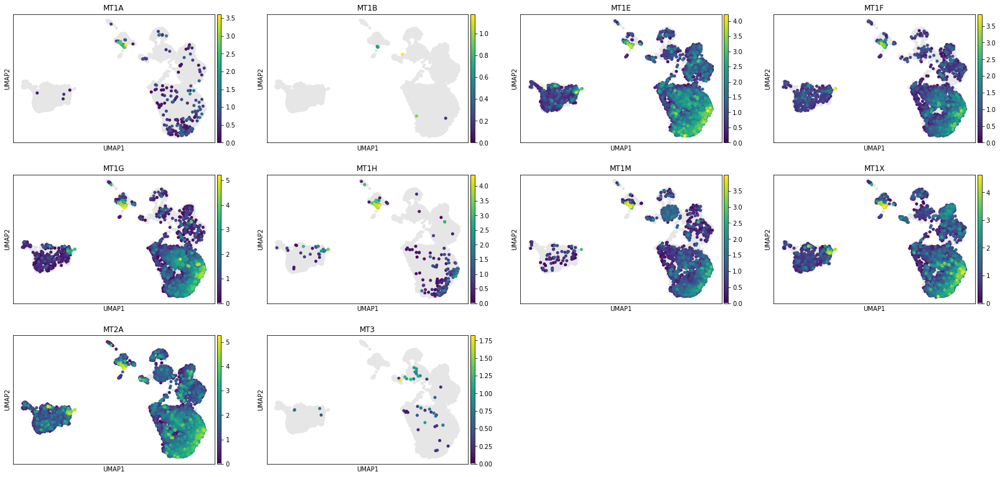

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([231/256, 231/256, 231/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)

sc.pl.umap(adata, color = ['MT1A', 'MT1B', 'MT1E', 'MT1F', 'MT1G', 'MT1H', 'MT1M','MT1X', 'MT2A', 'MT3'], size =100, color_map = newcmp)

In [18]:
# quickly prep the files
klk3_t = rankList('out/DEG/tumor vs normal/full/LE-KLK3_tumor_vs_normal.txt', True)
klk4_t = rankList('out/DEG/tumor vs normal/full/LE-KLK4_tumor_vs_normal.txt', True)

import gseapy as gp
pre_res_klk3_t = gp.prerank(rnk=klk3_t, 
                     gene_sets='./dataset/h.all.v7.0.symbols.gmt',
                     processes=20,
                     min_size=0,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk3_t.res2d.to_csv('out/GSEA/KLK3_tumor_vs_normal_Hallmark_gsea.txt', sep='\t')
pre_res_klk4_t = gp.prerank(rnk=klk4_t, 
                     gene_sets='./dataset/h.all.v7.0.symbols.gmt',
                     processes=20,
                     min_size=0,
                     max_size=1000,
                     permutation_num=1000, # reduce number to speed up testing
                     no_plot=True,
                     verbose=True)
pre_res_klk4_t.res2d.to_csv('out/GSEA/KLK4_tumor_vs_normal_Hallmark_gsea.txt', sep='\t')

2020-04-19 23:28:16,313 Parsing data files for GSEA.............................
2020-04-19 23:28:18,963 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2020-04-19 23:28:18,964 0050 gene_sets used for further statistical testing.....
2020-04-19 23:28:18,965 Start to run GSEA...Might take a while..................
2020-04-19 23:29:56,489 Start to generate gseapy reports, and produce figures...
2020-04-19 23:29:56,520 Congratulations. GSEApy runs successfully................

2020-04-19 23:29:56,555 Parsing data files for GSEA.............................
2020-04-19 23:29:59,251 0000 gene_sets have been filtered out when max_size=1000 and min_size=0
2020-04-19 23:29:59,254 0050 gene_sets used for further statistical testing.....
2020-04-19 23:29:59,254 Start to run GSEA...Might take a while..................
2020-04-19 23:30:11,804 Start to generate gseapy reports, and produce figures...
2020-04-19 23:30:11,832 Congratulations. GSEApy runs successfully............

In [46]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate_normal.h5ad'

adata = sc.read_h5ad(results_file)
adata = adata[adata.obs['celltype'].isin(['BE', 'CE', 'HE', 'LE-KLK3', 'LE-KLK4'])]
adata

scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


View of AnnData object with n_obs × n_vars = 4431 × 2137 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

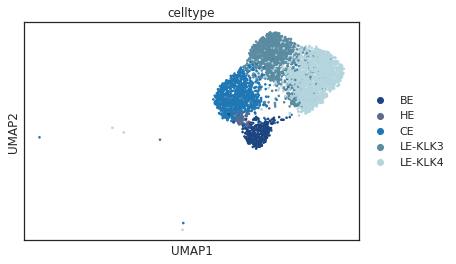

In [47]:
sc.pl.umap(adata, color = 'celltype')

In [48]:
gs = pd.read_csv('dataset/stemcellsignature.txt', sep = '\t')
gs

,hASC,naivehESC,primedhESC
0,VSNL1,DNMT3L,SALL2
1,AKR1B1,ALPPL2,DUSP6
2,NOTCH4,NLRP7,LRRN1
3,TMEM237,SLC25A16,P3H2
4,SAMD5,DPPA5,CDH2
5,PKD2,ATAD3B,VRTN
6,NAP1L1,OLAH,UCHL1
7,PTTG1,SAMHD1,STC1
8,CDK6,PYGB,FGFBP3
9,CDCA7,TFCP2L1,NELL2


In [49]:
for g in gs.columns:
    sc.tl.score_genes(adata, gs[g], score_name = str(g)+'_score', use_raw = True)

computing score 'hASC_score'
    finished: added
    'hASC_score', score of gene set (adata.obs) (0:00:00)
computing score 'naivehESC_score'
    finished: added
    'naivehESC_score', score of gene set (adata.obs) (0:00:00)
computing score 'primedhESC_score'
    finished: added
    'primedhESC_score', score of gene set (adata.obs) (0:00:00)


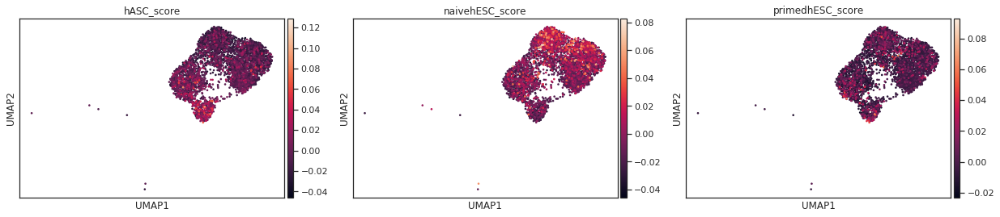

In [50]:
sc.pl.umap(adata, color = [str(g)+'_score' for g in gs.columns])

In [51]:
adata.obs.to_csv('figures/genesettest/stemness_normal.csv')

In [40]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)
adata = adata[adata.obs['celltype'].isin(['BE', 'CE', 'HE', 'LE-KLK3', 'LE-KLK4'])]
adata

scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


View of AnnData object with n_obs × n_vars = 10587 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [41]:
gs = pd.read_csv('dataset/stemcellsignature.txt', sep = '\t')
gs

,hASC,naivehESC,primedhESC
0,VSNL1,DNMT3L,SALL2
1,AKR1B1,ALPPL2,DUSP6
2,NOTCH4,NLRP7,LRRN1
3,TMEM237,SLC25A16,P3H2
4,SAMD5,DPPA5,CDH2
5,PKD2,ATAD3B,VRTN
6,NAP1L1,OLAH,UCHL1
7,PTTG1,SAMHD1,STC1
8,CDK6,PYGB,FGFBP3
9,CDCA7,TFCP2L1,NELL2


In [42]:
for g in gs.columns:
    sc.tl.score_genes(adata, gs[g], score_name = str(g)+'_score', use_raw = True)

computing score 'hASC_score'


Trying to set attribute `.obs` of view, making a copy.


    finished: added
    'hASC_score', score of gene set (adata.obs) (0:00:00)
computing score 'naivehESC_score'
    finished: added
    'naivehESC_score', score of gene set (adata.obs) (0:00:00)
computing score 'primedhESC_score'
    finished: added
    'primedhESC_score', score of gene set (adata.obs) (0:00:00)


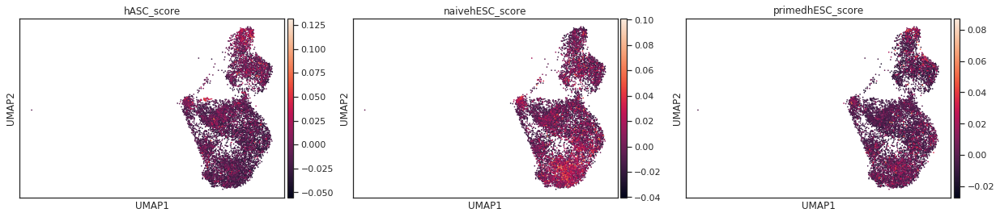

In [43]:
sc.pl.umap(adata, color = [str(g)+'_score' for g in gs.columns])

In [45]:
adata.obs.to_csv('figures/genesettest/stemness.csv')

In [52]:
adata.uns['celltype_colors']

['#1c4481', '#60688d', '#1f77b4', '#5b8ba1', '#b4d5de']

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)
# adata = adata[adata.obs['celltype'].isin(['BE', 'CE', 'HE', 'LE-KLK3', 'LE-KLK4'])]
adata

/home/jovyan/my-conda-envs/mypython3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


AnnData object with n_obs × n_vars = 17108 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

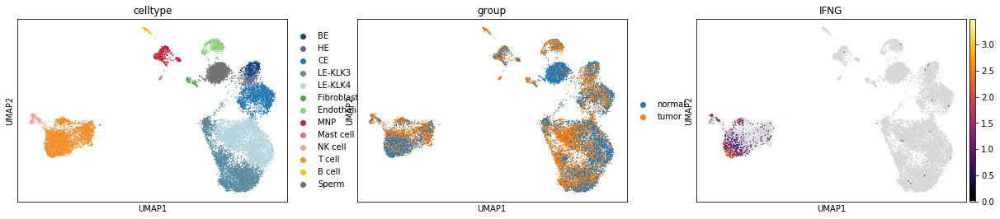

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridis = cm.get_cmap('inferno', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([215/256, 215/256, 215/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)
sc.pl.umap(adata, color = ['celltype', 'group', 'IFNG'], color_map = newcmp)

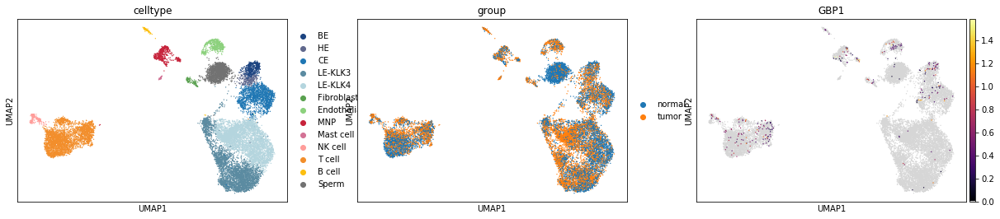

In [3]:
sc.pl.umap(adata, color = ['celltype', 'group', 'GBP1'], color_map = newcmp)

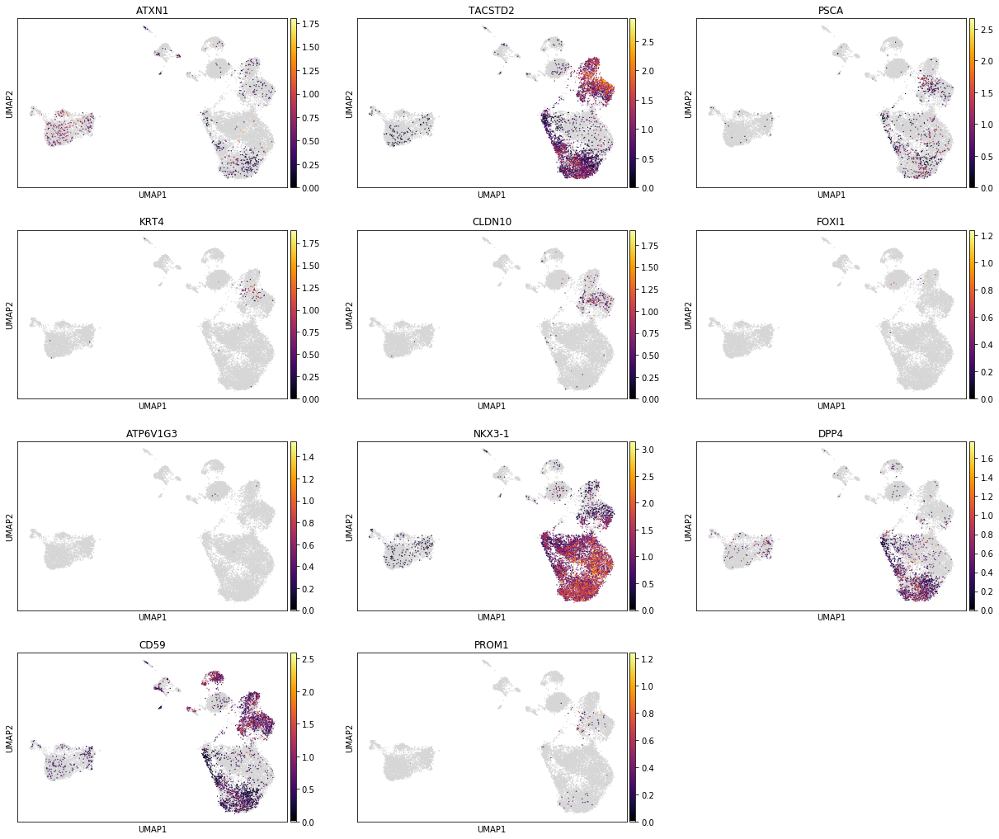

In [8]:
sc.pl.umap(adata, color = ['ATXN1', 'TACSTD2', 'PSCA', 'KRT4', 'CLDN10','FOXI1', 'ATP6V1G3', 'NKX3-1', 'DPP4', 'CD59', 'PROM1'], color_map = newcmp, ncols = 3)

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

results_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(results_file)
# adata = adata[adata.obs['celltype'].isin(['BE', 'CE', 'HE', 'LE-KLK3', 'LE-KLK4'])]
adata

/home/jovyan/my-conda-envs/mypython3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


AnnData object with n_obs × n_vars = 17108 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [4]:
adata = adata[adata.obs['celltype'].isin(['BE', 'HE', 'CE', 'LE-KLK3', 'LE-KLK4'])]
adata.obs['celltype_group'] = [c+'_'+g for c,g in zip(adata.obs['celltype'], adata.obs['group'])]

Trying to set attribute `.obs` of view, making a copy.


In [7]:
cell_cycle_genes = {'S':['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'HELLS', 'RFC2', 'RPA2', 'NASP', 'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8'],
'G2/M':['HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA']}

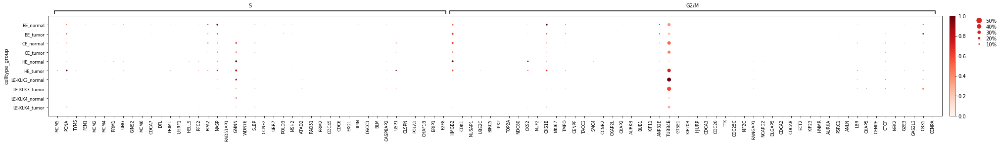

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[32.9, 0, 0.2, 0.5, 0.25])

In [8]:
sc.pl.dotplot(adata, cell_cycle_genes, groupby='celltype_group', standard_scale = 'var')

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

px_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(px_file)

/home/jovyan/my-conda-envs/mypython3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


In [41]:
geneset1 = {'TNFa Signaling Via NFkB':['JUN', 'JUNB', 'PMEPA1', 'FOS', 'IER2', 'GADD45B', 'ZFP36', 'DUSP1', 'FOSB', 'ATF3', 'CCNL1', 'EFNA1', 'HES1', 'TSC22D1', 'BTG1', 'CEBPD', 'ID2', 'NR4A1', 'CD44', 'BTG2', 'NFKBIA', 'MCL1', 'EGR1', 'IRF1', 'RHOB', 'KLF4', 'NAMPT', 'PPP1R15A', 'PNRC1', 'ZBTB10', 'SOCS3', 'KLF6', 'B4GALT1', 'SAT1', 'VEGFA', 'IL6ST', 'SQSTM1', 'MARCKS', 'LDLR', 'PHLDA2', 'CDKN1A', 'SDC4', 'CFLAR', 'IFNGR2', 'TGIF1', 'CCND1', 'IRS2', 'SOD2', 'NFAT5', 'ZC3H12A', 'KLF9', 'TRIB1', 'NFE2L2', 'MAFF']}
geneset2 = {'Androgen Response':['KLK3', 'KLK2', 'AZGP1', 'B2M', 'TMPRSS2', 'PMEPA1', 'PLPP1', 'ELK4', 'DHCR24', 'ACSL3', 'NDRG1', 'LMAN1', 'ABHD2', 'TMEM50A', 'SELENOP', 'ELOVL5', 'BMPR1B', 'LIFR', 'ABCC4', 'TSC22D1', 'STEAP4', 'INSIG1', 'SCD', 'ARID5B', 'SPCS3', 'DNAJB9', 'H1F0', 'SPDEF', 'MAF', 'ANKH', 'ZBTB10', 'B4GALT1', 'SAT1', 'ELL2', 'SLC38A2', 'IQGAP2', 'FKBP5', 'HOMER2', 'KRT8', 'ALDH1A3', 'PGM3']}
geneset3 = {'Estrogen Response Late':['CD9', 'CPE', 'XBP1', 'FOS', 'ZFP36', 'NBL1', 'ABHD2', 'PERP', 'CDH1', 'ELOVL5', 'EMP2', 'FLNB', 'TOB1', 'KLK11', 'MDK', 'ID2', 'AGR2', 'TFF3', 'TSPAN13', 'CD44', 'LSR', 'KLF4', 'FDFT1', 'IL6ST', 'FKBP5', 'HOMER2', 'FARP1', 'SFN', 'ST14', 'ADD3', 'KRT19', 'DNAJC1', 'CHPT1', 'SLC9A3R1', 'SLC26A2', 'PDCD4', 'PRSS23', 'NRIP1', 'CCND1', 'AFF1']}
geneset4 = {'Interferon gamma response':['B2M', 'HLA-B', 'HLA-A', 'CD38', 'LGALS3BP', 'TXNIP', 'TNFSF10', 'BTG1', 'TAPBP', 'ARID5B', 'STAT3', 'NFKBIA', 'IRF1', 'NAMPT', 'SOCS3', 'IFITM3', 'SPPL2A', 'ADAR', 'CDKN1A']}
geneset5 = {'MYC Target V1':['H2AFZ', 'EIF4A1', 'CDK4', 'FBL', 'RANBP1', 'RAD23B', 'YWHAE', 'TXNL4A', 'EIF3J', 'TCP1', 'EIF2S2', 'EEF1B2', 'LSM2', 'NAP1L1', 'LDHA', 'PRDX3', 'CCT4', 'SNRPD1', 'PSMC6', 'EIF4H', 'HSPE1', 'DUT', 'PABPC1', 'SSB', 'PTGES3', 'SNRPD2', 'PCBP1', 'PSMA7', 'YWHAQ', 'ERH', 'NPM1', 'PPIA', 'HNRNPA1', 'RPL18', 'RPS5', 'RPS10', 'RACK1', 'RPL22', 'RPLP0', 'RPL14', 'RPS3', 'RPS2', 'RPS6', 'RPL34']}

In [28]:
adata = adata[adata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4'])]
adata.obs['celltype_group'] = [c +'_'+g for c,g in zip(adata.obs['celltype'], adata.obs['group'])]

Trying to set attribute `.obs` of view, making a copy.


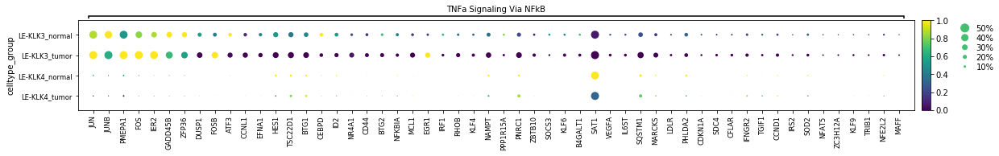

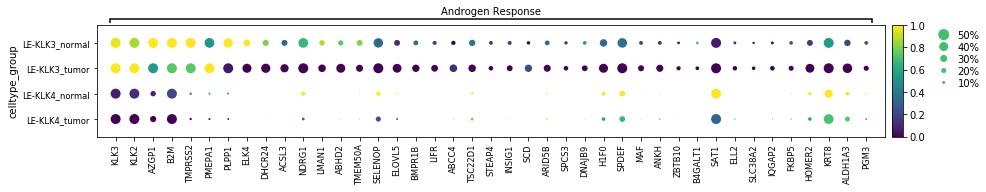

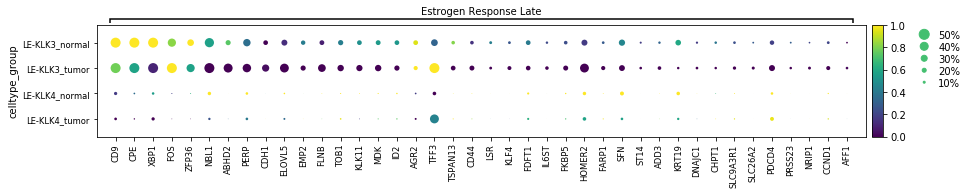

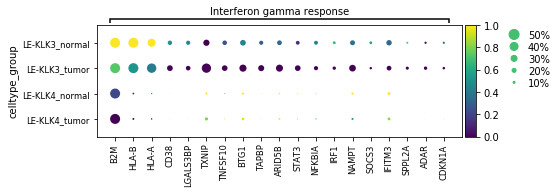

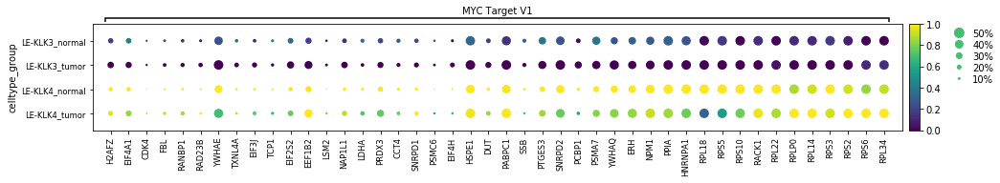

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[15.399999999999999, 0, 0.2, 0.5, 0.25])

In [49]:
sc.pl.dotplot(adata, geneset1, mean_only_expressed = True, groupby = 'celltype_group', standard_scale = 'var', color_map = 'viridis', dot_max = 0.5, var_group_rotation = 0, save='/klk_tnf_dotmap.pdf')
sc.pl.dotplot(adata, geneset2, mean_only_expressed = True, groupby = 'celltype_group', standard_scale = 'var', color_map = 'viridis', dot_max = 0.5, var_group_rotation = 0, save='/klk_andro_dotmap.pdf')
sc.pl.dotplot(adata, geneset3, mean_only_expressed = True, groupby = 'celltype_group', standard_scale = 'var', color_map = 'viridis', dot_max = 0.5, var_group_rotation = 0, save='/klk_estro_dotmap.pdf')
sc.pl.dotplot(adata, geneset4, mean_only_expressed = True, groupby = 'celltype_group', standard_scale = 'var', color_map = 'viridis', dot_max = 0.5, var_group_rotation = 0, save='/klk_ifn_dotmap.pdf')
sc.pl.dotplot(adata, geneset5, mean_only_expressed = True, groupby = 'celltype_group', standard_scale = 'var', color_map = 'viridis', dot_max = 0.5, var_group_rotation = 0, save='/klk_myc_dotmap.pdf')
    

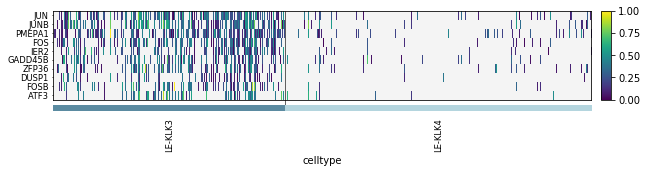

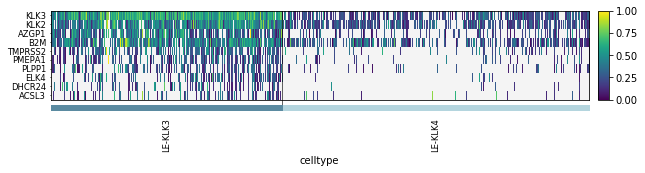

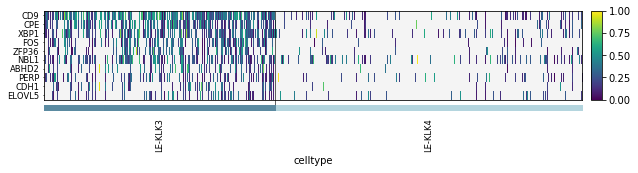

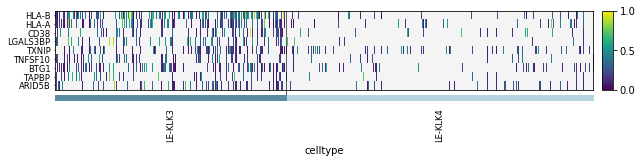

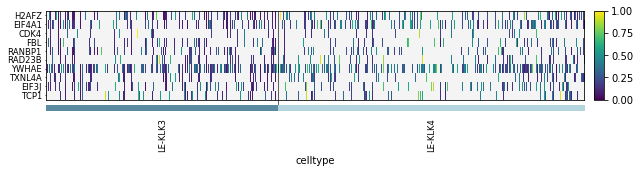

GridSpec(3, 3, height_ratios=[0, 1.7999999999999998, 0.13], width_ratios=[10, 0, 0.2])

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([245/256, 245/256, 245/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)

sc.pl.heatmap(ndata, genesets['TNFa Signaling Via NFkB'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_tnf_heatmap.pdf')
sc.pl.heatmap(ndata, genesets['Androgen Response'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_andro_heatmap.pdf')
sc.pl.heatmap(ndata, genesets['Estrogen Response Late'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_estro_heatmap.pdf')
sc.pl.heatmap(ndata, genesets['Interferon gamma response'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_ifng_heatmap.pdf')
sc.pl.heatmap(ndata, genesets['MYC Target V1'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True, save = '/klk_tnf_heatmap.pdf')

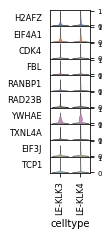

In [63]:
sc.pl.stacked_violin(ndata, genesets['MYC Target V1'], groupby = 'celltype', standard_scale = 'var', cmap = newcmp, swap_axes = True)

In [15]:
geneset2 = {'Androgen Response':['KLK3', 'KLK2', 'AZGP1', 'B2M', 'TMPRSS2', 'PMEPA1', 'PLPP1', 'ELK4', 'DHCR24', 'ACSL3', 'NDRG1', 'LMAN1', 'ABHD2', 'TMEM50A', 'SELENOP', 'ELOVL5', 'BMPR1B', 'LIFR', 'ABCC4', 'TSC22D1', 'STEAP4', 'INSIG1', 'SCD', 'ARID5B', 'SPCS3', 'DNAJB9', 'H1F0', 'SPDEF', 'MAF', 'ANKH', 'ZBTB10', 'B4GALT1', 'SAT1', 'ELL2', 'SLC38A2', 'IQGAP2', 'FKBP5', 'HOMER2', 'KRT8', 'ALDH1A3', 'PGM3']}

Trying to set attribute `.obs` of view, making a copy.
... storing 'celltype_group' as categorical


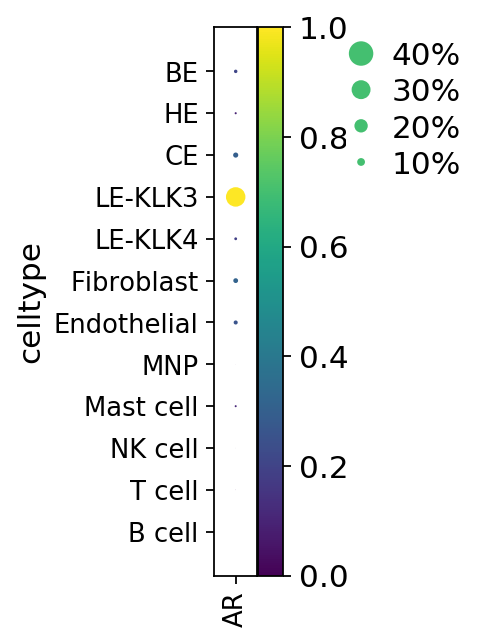

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[0.35, 0, 0.2, 0.5, 0.25])

In [36]:
adata = adata[~(adata.obs['celltype']=='Sperm')]
adata.obs['celltype_group'] = [c +'_'+g for c,g in zip(adata.obs['celltype'], adata.obs['group'])]
sc.pl.dotplot(adata, ['AR'], groupby = 'celltype', standard_scale = 'var', color_map ='viridis', save='/AR_dotmap.pdf')

Trying to set attribute `.obs` of view, making a copy.
... storing 'celltype_group' as categorical


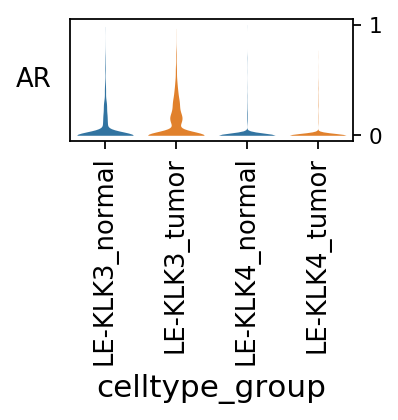

In [38]:
adata2 = adata[adata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4'])]
adata2.obs['celltype_group'] = [c +'_'+g for c,g in zip(adata2.obs['celltype'], adata2.obs['group'])]
sc.pl.stacked_violin(adata2, ['AR'], groupby = 'celltype_group', standard_scale = 'var', swap_axes = True, palette = adata2.uns['group_colors'], linewidth = 0, figsize = (2.5,1), save = '/AR_violin.pdf')

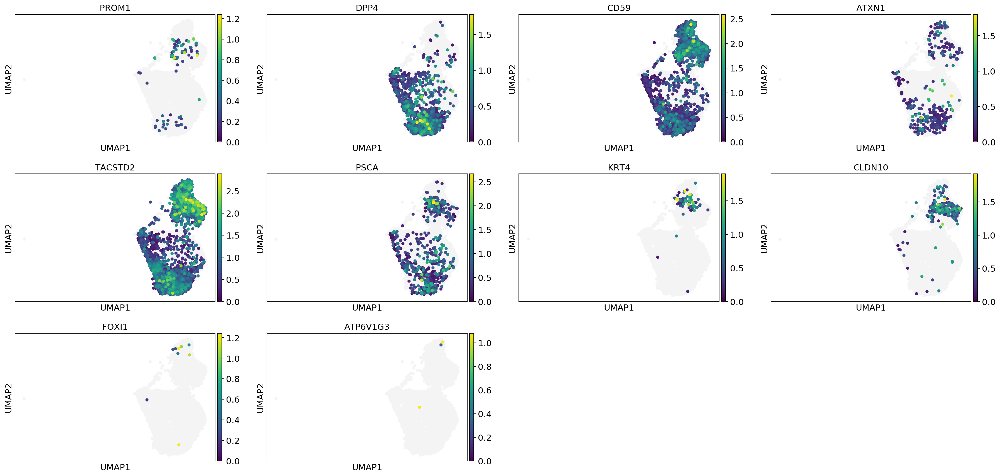

In [48]:
adata3 = adata[adata.obs['celltype'].isin(['BE', 'HE', 'CE', 'LE-KLK3', 'LE-KLK4'])]
sc.set_figure_params(figsize = [6.0, 4.0], vector_friendly = True, dpi_save = 900)
sc.pl.umap(adata3, color = [
                            'PROM1','DPP4','CD59',
                            'ATXN1', 'TACSTD2', 'PSCA', 'KRT4','CLDN10',
                            'FOXI1', 'ATP6V1G3'], color_map = newcmp, ncols = 4, size = 100, save = '/mouse_luminal_markers.pdf')

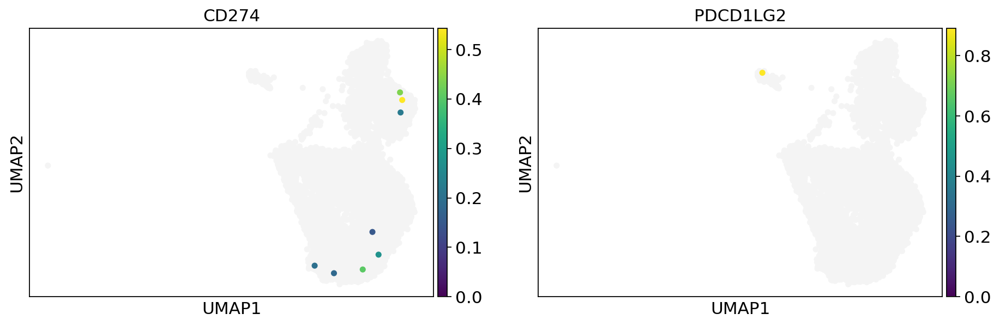

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([245/256, 245/256, 245/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)
sc.set_figure_params(figsize = [6.0, 4.0], vector_friendly = True, dpi_save = 900)
sc.pl.umap(adata[adata.obs['celltype'].isin(['BE', 'CE', 'HE', 'LE-KLK3', 'LE-KLK4', 'Fibroblast', ' Endothelial'])], color = ['CD274', 'PDCD1LG2'], color_map = newcmp, ncols = 2, size = 100, save = '/pdl1l2_umap.pdf')

In [40]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

px_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(px_file)

scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


In [41]:
adata = adata[~(adata.obs['celltype']=='Sperm')]
adata

View of AnnData object with n_obs × n_vars = 15492 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [42]:
pd.crosstab(adata.obs['patient'], adata.obs['group'])

group,normal,tumor
patient,,
D4,614,1677
D5,494,1692
D6,2684,1878
D7,100,86
D9,111,1088
D11,840,145
D12,1123,686
D13,613,481
D14,88,218


In [43]:
adata = adata[adata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4'])]
adata

View of AnnData object with n_obs × n_vars = 8166 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

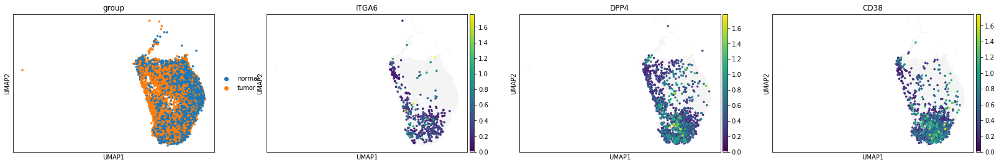

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([245/256, 245/256, 245/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)
sc.pl.umap(adata, color = ['group', 'ITGA6', 'DPP4', 'CD38'], color_map = newcmp, size = 50)

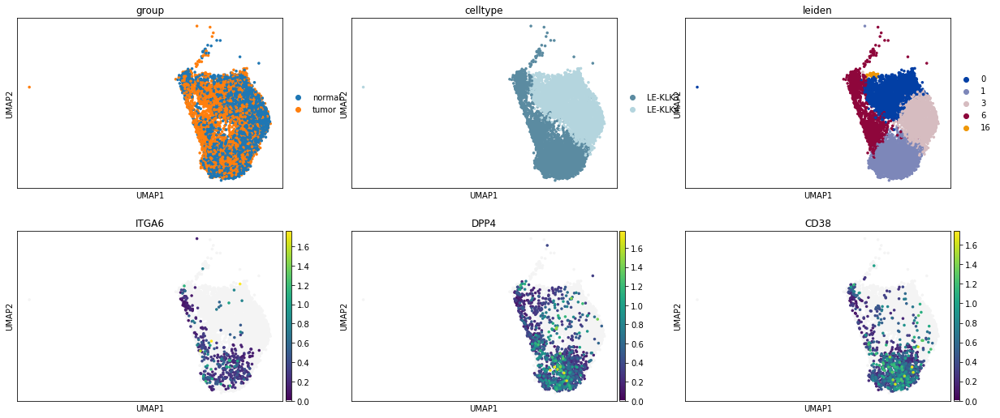

In [52]:
sc.pl.umap(adata, color = ['group', 'celltype', 'leiden', 'ITGA6', 'DPP4', 'CD38'], ncols = 3, color_map = newcmp, size = 50)

In [46]:
adata.obs['celltype_group'] = [c+'_'+g for g,c in zip(adata.obs['group'],adata.obs['celltype'])]
adata.obs['leiden_group'] = [c+'_'+g for g,c in zip(adata.obs['group'],adata.obs['leiden'])]

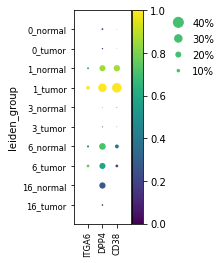

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[1.0499999999999998, 0, 0.2, 0.5, 0.25])

In [48]:
sc.pl.dotplot(adata, ['ITGA6', 'DPP4', 'CD38'], groupby = 'leiden_group', color_map = 'viridis', standard_scale = 'var')

In [51]:
pd.crosstab(adata.obs['leiden'], adata.obs['group'])

group,normal,tumor
leiden,,
0,682,1872
1,888,1617
3,1067,682
6,437,883
16,4,34


computing score 'test_score'
    finished: added
    'test_score', score of gene set (adata.obs) (0:00:00)


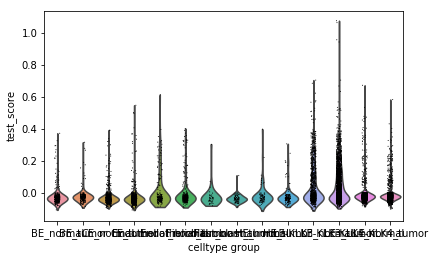

In [27]:
sc.tl.score_genes(adata, ['ITGA6', 'DPP4', 'CD38'], score_name = 'test_score', use_raw = True)
sc.pl.violin(adata[, 'test_score', groupby ='celltype_group')

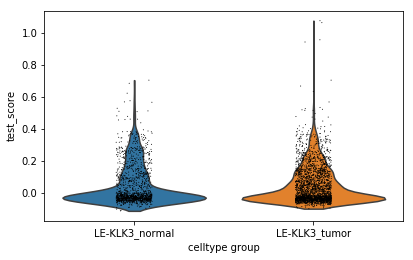

In [28]:
sc.pl.violin(adata[adata.obs['celltype']=='LE-KLK3'], 'test_score', groupby ='celltype_group')

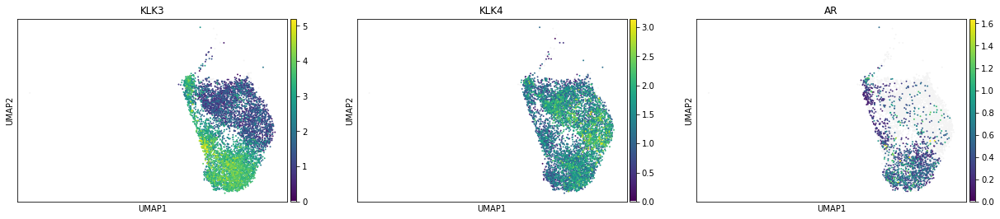

In [55]:
sc.pl.umap(adata, color = ['KLK3', 'KLK4', 'AR'], color_map = newcmp)

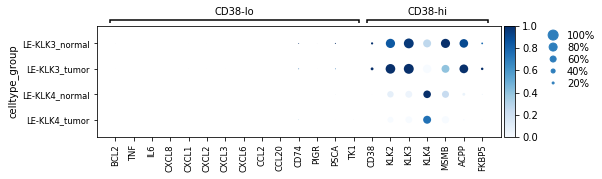

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[7.35, 0, 0.2, 0.5, 0.25])

In [69]:
sc.pl.dotplot(adata, {'CD38-lo':['BCL2', 'TNF', 'IL6', 'CXCL8', 'CXCL1', 'CXCL2', 'CXCL3', 'CXCL6', 'CCL2', 'CCL20', 'CD74', 'PIGR', 'PSCA', 'TK1'], 'CD38-hi':['CD38', 'KLK2', 'KLK3', 'KLK4', 'MSMB', 'ACPP', 'FKBP5']}, standard_scale ='var', groupby = 'celltype_group', var_group_rotation = 0, color_map = 'Blues', use_raw =True)

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

px_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(px_file)

/home/jovyan/my-conda-envs/mypython3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


In [ ]:
# There has been some updates to the patient info, so i'm updating the info and plots
# meta info
sInfo = pd.read_csv('../sampleInfo.txt', sep = '\t', index_col = 1)
sInfo.drop('Unnamed: 0', axis = 1, inplace = True)
# convert to dictionary
newInfo_dict = sInfo.to_dict(orient='dict')
# map to the obs slot
for info in newInfo_dict:
    adata.obs[info] = [newInfo_dict[info][s] for s in adata.obs['sample']]
    
adata.write(px_file, compression = 'gzip')

... storing 'barcode' as categorical
... storing 'group' as categorical
... storing 'highest_GLEASON_score' as categorical
... storing 'name' as categorical
... storing 'patient' as categorical
... storing 'pool' as categorical
... storing 'Biopsy Location DETAIL' as categorical
... storing 'Biopsy Location BRIEF' as categorical
... storing 'Biopsy Location Co-ordinate' as categorical
... storing 'PMHx' as categorical


In [3]:
adata = adata[~(adata.obs['celltype'] == 'Sperm')]
adata

View of AnnData object with n_obs × n_vars = 15492 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype', 'Biopsy Location DETAIL', 'Biopsy Location BRIEF', 'Biopsy Location Co-ordinate', 'PMHx'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

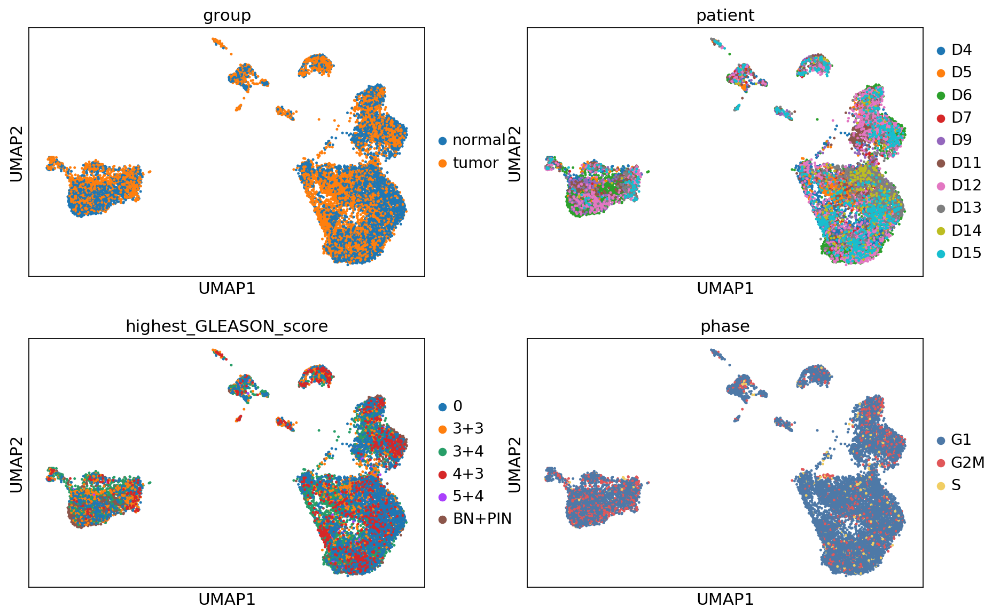

In [4]:
# subset to epithelial
# adata = adata[adata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4', 'BE', 'HE', 'CE'])]
sc.set_figure_params(vector_friendly=True, dpi_save=900, figsize = (6,4))
sc.set_figure_params(vector_friendly=True, dpi_save=900, figsize = (6,4))sc.pl.umap(adata, color = ['group', 'patient', 'highest_GLEASON_score', 'phase'], size = 20, ncols = 2, save = '/metainfo_umap_new.pdf')

In [ ]:
sc.set_figure_params(vector_friendly=True, figsize = (6,4))
for x in list(set(adata.obs['Biopsy Location BRIEF'])):
    sc.pl.umap(adata, color = ['Biopsy Location BRIEF'], groups = [x], size = 20, ncols = 2)

In [ ]:
for x in list(set(adata.obs['Biopsy Location BRIEF'])):
    sc.pl.umap(adata, color = ['Biopsy Location BRIEF'], groups = [x], size = 20, ncols = 2)

In [21]:
sc.pl.umap(adata, color = ['Biopsy Location BRIEF'], groups = ['ANTERIOR'], size = 20, ncols = 2)

,age,barcode,batch,group,highest_GLEASON_score,mri_grading,name,patient,pool,psa,...,n_counts,S_score,G2M_score,phase,leiden,celltype,Biopsy Location DETAIL,Biopsy Location BRIEF,Biopsy Location Co-ordinate,PMHx
index,,,,,,,,,,,,,,,,,,,,,
SLX-15732SIGAC4HTVNWBBXXs_6_AAACCTGCAGACAAAT,72,SIGAC4,0,tumor,3+4,3,D6_T,D6,SLX-15732,7.3,...,910.442322,-0.038921,-0.019075,G1,2,T cell,LEFT anterior lateral,ANTERIOR,6L,"HTN, IHD, CKD"
SLX-15732SIGAC4HTVNWBBXXs_6_AAACCTGGTACCGCTG,72,SIGAC4,0,tumor,3+4,3,D6_T,D6,SLX-15732,7.3,...,829.173584,-0.006429,-0.016349,G1,10,MNP,LEFT anterior lateral,ANTERIOR,6L,"HTN, IHD, CKD"
SLX-15732SIGAC4HTVNWBBXXs_6_AAACCTGTCGGAATCT,72,SIGAC4,0,tumor,3+4,3,D6_T,D6,SLX-15732,7.3,...,1604.888428,-0.000949,0.008163,G2M,9,Endothelial,LEFT anterior lateral,ANTERIOR,6L,"HTN, IHD, CKD"
SLX-15732SIGAC4HTVNWBBXXs_6_AAACGGGGTCGTGGCT,72,SIGAC4,0,tumor,3+4,3,D6_T,D6,SLX-15732,7.3,...,3186.688965,-0.042204,-0.025815,G1,1,LE-KLK3,LEFT anterior lateral,ANTERIOR,6L,"HTN, IHD, CKD"
SLX-15732SIGAC4HTVNWBBXXs_6_AAACGGGGTCTGATCA,72,SIGAC4,0,tumor,3+4,3,D6_T,D6,SLX-15732,7.3,...,1849.854370,-0.021372,-0.030348,G1,1,LE-KLK3,LEFT anterior lateral,ANTERIOR,6L,"HTN, IHD, CKD"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SLX-16362SIGAB3HWFTVBBXXs_4_TTCGAAGCAAGGCTCC,67,SIGAB3,23,normal,0,0,D15_N,D15,SLX-16362,22.2,...,1522.785156,-0.023681,-0.008259,G1,6,LE-KLK3,?,?,?,?
SLX-16362SIGAB3HWFTVBBXXs_4_TTCTCCTCAACTGCGC,67,SIGAB3,23,normal,0,0,D15_N,D15,SLX-16362,22.2,...,303.008972,0.005774,-0.018038,S,3,LE-KLK4,?,?,?,?
SLX-16362SIGAB3HWFTVBBXXs_4_TTCTCCTTCAATCACG,67,SIGAB3,23,normal,0,0,D15_N,D15,SLX-16362,22.2,...,267.102722,0.004727,-0.009849,S,3,LE-KLK4,?,?,?,?


In [2]:
adata = adata[(adata.obs['celltype'].isin(['LE-KLK4', 'LE-KLK3']))]
adata

View of AnnData object with n_obs × n_vars = 8166 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype', 'Biopsy Location DETAIL', 'Biopsy Location BRIEF', 'Biopsy Location Co-ordinate', 'PMHx'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

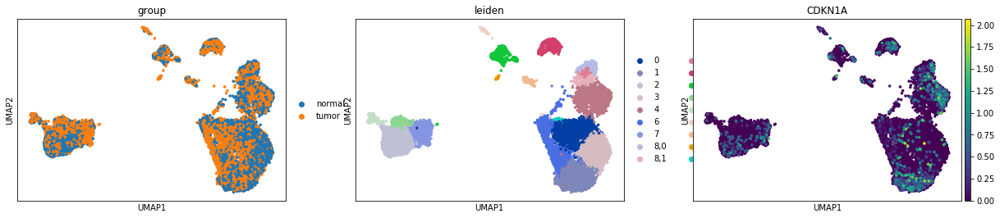

In [22]:
sc.pl.umap(adata, color =['group','leiden', 'CDKN1A'], size = 50)

In [11]:
adata = adata[~(adata.obs['celltype'] == 'Sperm')]
adata

View of AnnData object with n_obs × n_vars = 15492 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype', 'Biopsy Location DETAIL', 'Biopsy Location BRIEF', 'Biopsy Location Co-ordinate', 'PMHx'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

... storing 'celltype_group' as categorical


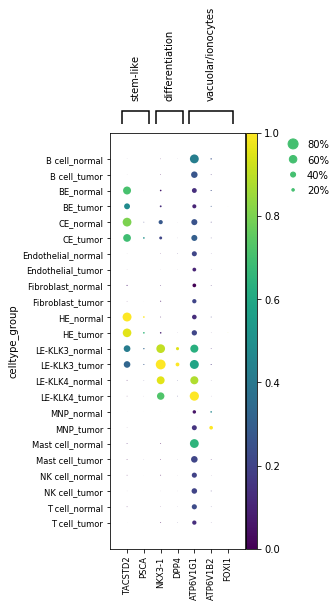

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[2.4499999999999997, 0, 0.2, 0.5, 0.25])

In [20]:
genesmarkers = {'stem-like':['TACSTD2', 'PSCA'], 'differentiation':['NKX3-1', 'DPP4'], 'vacuolar/ionocytes':['ATP6V1G1', 'ATP6V1B2', 'FOXI1']}
adata.obs['celltype_group'] = [c+'_'+g for g,c in zip(adata.obs['group'],adata.obs['celltype'])]
adata2 = adata[adata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4'])]
sc.pl.dotplot(adata, genesmarkers, standard_scale = 'var', groupby = 'celltype_group', color_map = 'viridis')

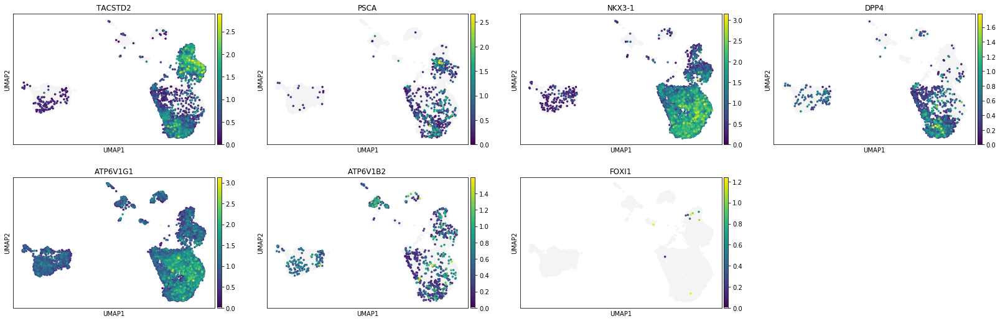

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([245/256, 245/256, 245/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)
sc.pl.umap(adata, color = ['TACSTD2', 'PSCA', 'NKX3-1', 'DPP4', 'ATP6V1G1', 'ATP6V1B2', 'FOXI1'], color_map = newcmp, size = 50)

In [15]:
prolaris=['FOXM1', 'CDC20', 'CDKN3', 'CDC2', 'KIF11', 'KIAA0101', 'NUSAP1', 'CENPF', 'ASPM', 'BUB1B', 'RRM2', 'DLGAP5', 'BIRC5', 'KIF20A', 'PLK1', 'TOP2A', 'TK1', 'PBK', 'ASF1B', 'C18orf24', 'RAD54L', 'PTTG1', 'CDCA3', 'MCM10', 'PRC1', 'DTL', 'CEP55', 'RAD51', 'CENPM', 'CDCA8', 'ORC6L']

computing score 'Prolaris_score'
    finished: added
    'Prolaris_score', score of gene set (adata.obs) (0:00:01)


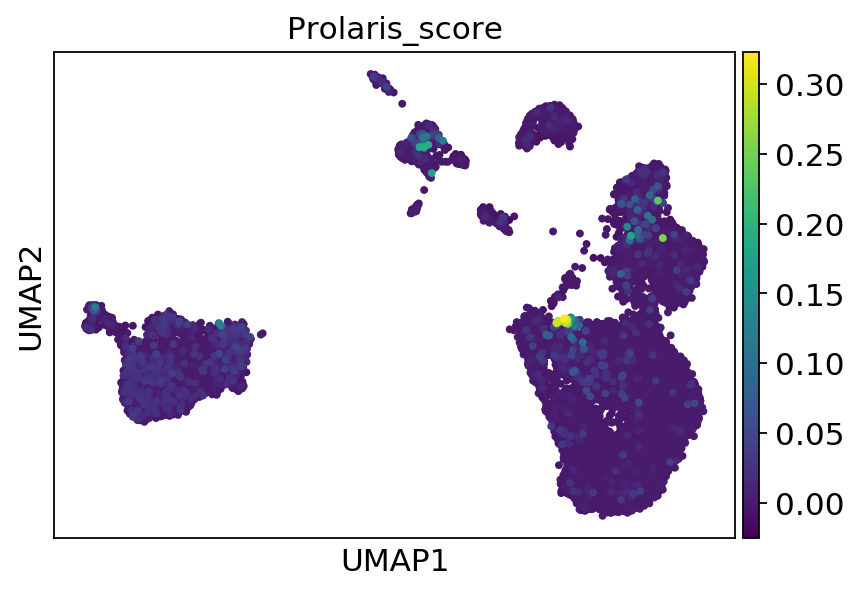

In [28]:
sc.tl.score_genes(adata, prolaris, score_name = 'Prolaris_score', use_raw = True)
sc.set_figure_params(figsize = [6.0, 4.0], vector_friendly = True, dpi_save = 900)
sc.pl.umap(adata, color = ['Prolaris_score'], size = 50,save = '/prolaris_score.pdf')

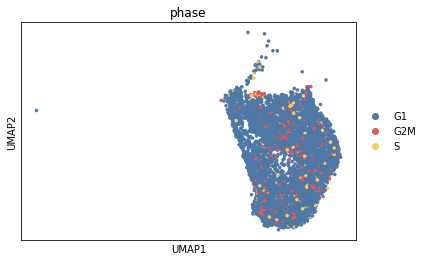

In [5]:
adata2 = adata[adata.obs['celltype'].isin(['LE-KLK3', 'LE-KLK4'])]
sc.pl.umap(adata2, color = ['phase'], size = 50)

In [11]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

warnings.filterwarnings('ignore')
os.chdir(os.path.expanduser('/home/jovyan/Prostate_analysis/scanpy'))
sc.settings.verbosity = 3
sc.logging.print_versions()

px_file = 'out/prostate.h5ad'

adata = sc.read_h5ad(px_file)
adata

scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.4.1 pandas==0.25.1 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


AnnData object with n_obs × n_vars = 17108 × 1487 
    obs: 'age', 'barcode', 'batch', 'group', 'highest_GLEASON_score', 'mri_grading', 'name', 'patient', 'pool', 'psa', 'sample', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'celltype', 'Biopsy Location DETAIL', 'Biopsy Location BRIEF', 'Biopsy Location Co-ordinate', 'PMHx'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'dendrogram_leiden', 'group_colors', 'leiden', 'leiden_colors', 'neighbors', 'patient_colors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

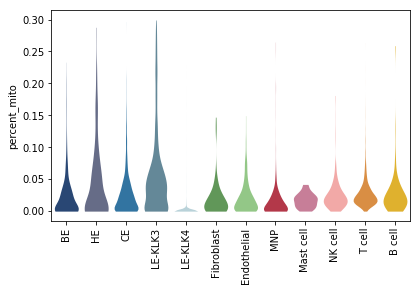

In [10]:
sc.pl.violin(adata[~(adata.obs['celltype']=='Sperm')], ['percent_mito'], groupby = 'celltype', rotation = 90, size = 0, palette = adata.uns['celltype_colors'], linewidth = 0)

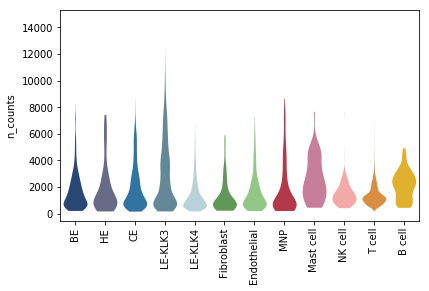

In [13]:
sc.pl.violin(adata[~(adata.obs['celltype']=='Sperm')], ['n_counts'], groupby = 'celltype', rotation = 90, size = 0, palette = adata.uns['celltype_colors'], linewidth = 0)